In [1]:
import pandas as pd

## 1. Read Metadata

In [2]:
meta_data = pd.read_csv('../../../For_analysis/RNASequencing/IR3/metaDataIR3.csv')
meta_data

,HudAlphaID,QCflagIR3,Specimen Bar Code,PATNO,GENDER,DIAGNOSIS,CLINICAL_EVENT,Specimen Bar Code.1,Quantity (ug),Concentration (ng/ul),...,MEDIAN_3PRIME_BIAS,NUM_UNEXPLAINED_READS,PCT_RIBOSOMAL_BASES,PCT_INTRONIC_BASES,PCT_R2_TRANSCRIPT_STRAND_READS,PCT_MRNA_BASES,MEDIAN_5PRIME_TO_3PRIME_BIAS,PCT_R1_TRANSCRIPT_STRAND_READS,MEDIAN_5PRIME_BIAS,PCT_USABLE_BASES
0,5104-SL-0001,pass,0000373111,3174,Male,PD,V08,0000373111,1.0,115.90,...,0.845235,1093161,0.0,43.4564,98.1025,50.4726,1.191875,1.8975,1.019442,47.9359
1,5104-SL-0002,pass,PP0016-0526,3201,Female,Control,BL,PP0016-0526,1.0,80.07,...,0.913436,569224,0.0,52.9752,98.1428,40.6987,1.058616,1.8572,0.965040,39.6130
2,5104-SL-0003,pass,0003125874,3057,Female,Control,V06,0003125874,1.0,219.70,...,0.902573,485102,0.0,52.2706,95.4321,36.0884,1.095971,4.5679,0.997003,34.8096
3,5104-SL-0004,pass,0003179818,4126,Male,PD,V04,0003179818,1.0,100.06,...,0.856690,1145227,0.0,45.9355,98.3785,48.3407,1.170152,1.6215,1.013765,45.3119
4,5104-SL-0005,pass,0003164601,4117,Female,PD,BL,0003164601,1.0,124.40,...,0.894656,461631,0.0,58.3984,98.0678,35.8255,1.113733,1.9322,0.985280,34.8793
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4866,5104-SL-4890,pass,0003314545,41314,Female,Genetic Cohort,V02,0003314545,1.0,105.10,...,0.707867,1097837,0.0,41.6055,92.5357,40.2167,1.526826,7.4643,1.086717,36.7253
4867,5104-SL-4891,pass,0003376702,42308,Male,Genetic Cohort,V02,0003376702,1.0,56.09,...,0.719713,775420,0.0,47.0490,97.3024,38.8043,1.269003,2.6976,0.946045,35.5802
4868,5104-SL-4892,pass,0003376763,42306,Male,Genetic Cohort,V02,0003376763,1.0,59.68,...,0.736184,794163,0.0,49.0178,97.0378,38.4877,1.300012,2.9622,0.995326,35.4419
4869,5104-SL-4893,pass,0003203630,1010,Unk,HCPOOL,Unk,0003203630,1.0,50.00,...,0.707379,748803,0.0,40.0865,95.8621,44.4177,1.479038,4.1379,1.031890,41.3555


In [3]:
meta_data.columns

Index(['HudAlphaID', 'QCflagIR3', 'Specimen Bar Code', 'PATNO', 'GENDER',
       'DIAGNOSIS', 'CLINICAL_EVENT', 'Specimen Bar Code.1', 'Quantity (ug)',
       'Concentration (ng/ul)', 'Concentration Flag', 'Submitted Volume (ul)',
       'Normalization Volume (30ng/ul)', 'Total Volume (ul)',
       'Input RNASeq (ng)', 'Input miRNA (ng)', '260/280 Ratio',
       '260/230 Ratio', 'RIN Value', 'BOX', 'POSITION', 'Plate', 'Sample',
       'deletion_length', 'insertion_length', 'mismatch_rate',
       'multimapped_percent', 'uniquely_mapped_percent',
       'num_annotated_splices', 'insertion_rate', 'unmapped_other_percent',
       'multimapped', 'num_splices', 'avg_input_read_length',
       'multimapped_toomany', 'total_reads', 'num_GCAG_splices',
       'unmapped_tooshort', 'unmapped_other', 'unmapped_mismatches_percent',
       'num_noncanonical_splices', 'num_ATAC_splices',
       'multimapped_toomany_percent', 'avg_mapped_read_length',
       'unmapped_mismatches', 'deletion_rate', '

In [4]:
meta_data.PATNO.value_counts()

PATNO
1010     53
1009     53
4104      5
3229      5
3214      5
         ..
42349     1
42298     1
42305     1
42431     1
42312     1
Name: count, Length: 1603, dtype: int64

In [5]:
disease_df = meta_data[['PATNO','DIAGNOSIS']].drop_duplicates()

In [6]:
disease_df.DIAGNOSIS.value_counts()

DIAGNOSIS
Genetic Registry    435
PD                  425
Genetic Cohort      418
Control             196
Prodromal            64
SWEDD                63
PDPOOL                1
HCPOOL                1
Name: count, dtype: int64

In [7]:
import os

In [8]:
l = 0
for i in os.listdir('../../../For_analysis/RNASequencing/IR3/quant/'):
    l = l + 1
    print(i)
    if l==3:
        break

PPMI-Phase2-IR3.3813.V02.PP0013-6148.5104-SL-4635.longRNA-NEBKAP.salmon.genes.sf
PPMI-Phase2-IR3.3481.BL.0003119333.5104-SL-0197.longRNA-NEBKAP.salmon.genes.sf
PPMI-Phase1-IR3.18567.BL.0000302585.5104-SL-1516.longRNA-NEBKAP.salmon.genes.sf


## 2. Read Gene list (Smaller)

In [9]:
gene_excel = pd.ExcelFile('/12tb_dsk3/For_analysis/Modified Master DNA Repair List HN NPM.xlsx')
df2 = pd.read_excel(gene_excel, 'smaller')
df1 = pd.read_excel(gene_excel, 'Integrated stress response')

In [10]:
df2

,Break Induced Replication - Should we omit? this pathway? It would also have a ton of HR proteins involved,,,,Column4,Column5,Column6,Column7,Column8,Column9,...,Column16374,Column16375,Column16376,Column16377,Column16378,Column16379,Column16380,Column16381,Column16382,Column16383
0,NaN,BLM,"BS, MGRISCE1, RECQ2, RECQL2, RECQL3",PMID: 35440629,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,DCLRE1A,"PSO2, SNM1, SNM1A",PMID: 37316655,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,MCMDC2,6030422M02Rik,GeneCards,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,POLD1,"CDC2, CRCS10, MDPL, POLD",PMID: 24310611,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,POLD2,-,PMID: 24310611,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
108,NaN,POLK,"DINB1, DINP, POLQ",PMID: 11842189,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
109,NaN,POLN,POL4P,PMID: 16787914,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
110,NaN,POLQ,PRO0327,PMID: 24648516,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
111,NaN,PRIMPOL,"CCDC111, MYP22, Primpol1",PMID: 24240614,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [11]:
gene_list = df2.iloc[:,1].tolist()

In [12]:
import numpy as np
for i in range(100):
    try:
        gene_list.remove(np.nan) # run 4 times
    except:
        break

In [13]:
gene_list = [i.strip() for i in gene_list]

In [14]:
gene_list = set(gene_list)

In [15]:
len(gene_list )

96

In [16]:

from pybiomart import Server

# Connect to the Ensembl server
server = Server(host='http://www.ensembl.org')
dataset = server.marts['ENSEMBL_MART_ENSEMBL'].datasets['hsapiens_gene_ensembl']  # Replace with your organism

# Query for gene names and Ensembl IDs
# Replace 'BRCA1' with your gene of interest or a list of genes
genes_of_interest = gene_list
query_results = dataset.query(attributes=['external_gene_name', 'ensembl_gene_id'])

# Filter results for your genes of interest
results = query_results[query_results['Gene name'].isin(genes_of_interest)]
print(results)


      Gene name   Gene stable ID
2232     GTF2H1  ENSG00000288114
2238      SHLD1  ENSG00000171984
2974      ERCC5  ENSG00000134899
3129       LIG4  ENSG00000174405
4837       APTX  ENSG00000137074
...         ...              ...
76354     POLE4  ENSG00000115350
81706       XPC  ENSG00000154767
82903    FAAP20  ENSG00000162585
83467     MUTYH  ENSG00000132781
83713    MAD2L2  ENSG00000116670

[107 rows x 2 columns]


In [17]:
set(gene_list) - set(results['Gene name'].tolist())

{'DTXL3'}

In [18]:
set(results['Gene name'].tolist()) - set(gene_list) 

set()

In [19]:
keep_genes = results['Gene stable ID'].tolist()

In [20]:
keep_genes.append('ENSG00000163840')

In [21]:
keep_genes

['ENSG00000288114',
 'ENSG00000171984',
 'ENSG00000134899',
 'ENSG00000174405',
 'ENSG00000137074',
 'ENSG00000291803',
 'ENSG00000291796',
 'ENSG00000042088',
 'ENSG00000196419',
 'ENSG00000166169',
 'ENSG00000119318',
 'ENSG00000292286',
 'ENSG00000005156',
 'ENSG00000100823',
 'ENSG00000155229',
 'ENSG00000112130',
 'ENSG00000113522',
 'ENSG00000101751',
 'ENSG00000077514',
 'ENSG00000169188',
 'ENSG00000101868',
 'ENSG00000129484',
 'ENSG00000225830',
 'ENSG00000122376',
 'ENSG00000152422',
 'ENSG00000073050',
 'ENSG00000100387',
 'ENSG00000147400',
 'ENSG00000179262',
 'ENSG00000163961',
 'ENSG00000213780',
 'ENSG00000276910',
 'ENSG00000122678',
 'ENSG00000168496',
 'ENSG00000275045',
 'ENSG00000039650',
 'ENSG00000198924',
 'ENSG00000164306',
 'ENSG00000170734',
 'ENSG00000148229',
 'ENSG00000163945',
 'ENSG00000111358',
 'ENSG00000292191',
 'ENSG00000175482',
 'ENSG00000076924',
 'ENSG00000226384',
 'ENSG00000049167',
 'ENSG00000236895',
 'ENSG00000056050',
 'ENSG00000234370',


In [22]:
len(set(keep_genes))

108

In [23]:
len(set(results['Gene name'].tolist()))

95

In [24]:
n=set(results['Gene name'].tolist())

In [25]:
results['Gene name'].value_counts()

Gene name
GTF2H4    6
GTF2H2    3
CETN2     2
GTF2H1    2
PARP2     2
         ..
FEN1      1
POLM      1
RNF168    1
RAD23A    1
POLD4     1
Name: count, Length: 95, dtype: int64

## 3. Read RNA seq (count normalized)

In [26]:
sample_3813 = pd.read_csv('../../../For_analysis/RNASequencing/IR3/quant/PPMI-Phase2-IR3.3813.V02.PP0013-6148.5104-SL-4635.longRNA-NEBKAP.salmon.genes.sf' ,sep = '\t')
m = [i.split('.')[0] for i in sample_3813.Name.tolist()]

In [27]:
len(m)

58294

In [28]:
keep_genes = list(set(m).intersection(keep_genes))

In [29]:
keep_genes

['ENSG00000122008',
 'ENSG00000076248',
 'ENSG00000109674',
 'ENSG00000188827',
 'ENSG00000079246',
 'ENSG00000039650',
 'ENSG00000100387',
 'ENSG00000134899',
 'ENSG00000129484',
 'ENSG00000163161',
 'ENSG00000163945',
 'ENSG00000042088',
 'ENSG00000062822',
 'ENSG00000169621',
 'ENSG00000012061',
 'ENSG00000179262',
 'ENSG00000139372',
 'ENSG00000177084',
 'ENSG00000178460',
 'ENSG00000123415',
 'ENSG00000100479',
 'ENSG00000067369',
 'ENSG00000122678',
 'ENSG00000135945',
 'ENSG00000112130',
 'ENSG00000162585',
 'ENSG00000213780',
 'ENSG00000073050',
 'ENSG00000041880',
 'ENSG00000114026',
 'ENSG00000172613',
 'ENSG00000132781',
 'ENSG00000105486',
 'ENSG00000129071',
 'ENSG00000020922',
 'ENSG00000163961',
 'ENSG00000166169',
 'ENSG00000110768',
 'ENSG00000134574',
 'ENSG00000175595',
 'ENSG00000175482',
 'ENSG00000119318',
 'ENSG00000143799',
 'ENSG00000122376',
 'ENSG00000148229',
 'ENSG00000169188',
 'ENSG00000174405',
 'ENSG00000115350',
 'ENSG00000056050',
 'ENSG00000136936',


In [30]:
len(keep_genes)

96

In [31]:
l = 0
from tqdm import tqdm
data = pd.DataFrame(columns=keep_genes)
for i in tqdm(os.listdir('../../../For_analysis/RNASequencing/IR3/quant/')):
    if 'genes' not in i:
        continue
    
    read_file_path = '../../../For_analysis/RNASequencing/IR3/quant/'+ str(i)
    df = pd.read_csv(read_file_path ,sep = '\t')
    #print(df.head())
    m = [i.split('.')[0] for i in df.Name.tolist()]
    df['Name'] = m 
    df = df.rename(columns={'TPM': i})
    #print(df.head())
    df = df.set_index('Name')[[i]].T
    
    df = df[keep_genes]
    #print(df.head())
    data = pd.concat([data,df])


  0%|                                                                                                                                         | 0/9513 [00:00<?, ?it/s]/tmp/ipykernel_130578/3419326005.py:19: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  data = pd.concat([data,df])
100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9513/9513 [01:56<00:00, 81.47it/s]


In [32]:
data.sort_index()

,ENSG00000122008,ENSG00000076248,ENSG00000109674,ENSG00000188827,ENSG00000079246,ENSG00000039650,ENSG00000100387,ENSG00000134899,ENSG00000129484,ENSG00000163161,...,ENSG00000076924,ENSG00000163918,ENSG00000104884,ENSG00000168496,ENSG00000154328,ENSG00000167986,ENSG00000164306,ENSG00000140398,ENSG00000077514,ENSG00000009413
PPMI-Phase1-IR3.1009.POOL.0003202425.5104-SL-0095.longRNA-NEBKAP.salmon.genes.sf,16.98980,3.37948,2.05785,2.006420,91.6535,28.10960,25.7731,49.7788,6.43390,13.20550,...,4.35450,4.26970,2.327010,1.89728,3.957140,38.4074,9.84221,4.34593,13.69080,29.4800
PPMI-Phase1-IR3.1009.POOL.0003202427.5104-SL-0287.longRNA-NEBKAP.salmon.genes.sf,11.32090,1.79932,1.79298,0.565336,75.6103,11.72230,21.7714,29.9602,4.22713,7.69822,...,2.16405,2.28544,0.895042,1.49045,2.265990,23.4266,5.44253,2.58527,6.10309,13.5996
PPMI-Phase1-IR3.1009.POOL.0003202429.5104-SL-0479.longRNA-NEBKAP.salmon.genes.sf,13.28100,3.00504,1.93433,1.059810,87.8305,15.71980,31.8490,33.8660,4.03341,9.92887,...,3.22557,4.12336,1.071130,2.38456,2.578720,24.1408,9.15664,2.79138,8.13078,21.2054
PPMI-Phase1-IR3.1009.POOL.0003202431.5104-SL-0671.longRNA-NEBKAP.salmon.genes.sf,13.24290,2.77832,1.94135,0.958297,85.2848,14.80500,29.4653,37.9279,4.82887,8.57451,...,2.96591,3.63097,0.970934,1.90707,2.826950,25.7850,7.81032,3.05775,7.40150,18.0808
PPMI-Phase1-IR3.1009.POOL.0003202432.5104-SL-0767.longRNA-NEBKAP.salmon.genes.sf,15.29950,3.04954,1.91128,0.883796,86.3129,15.33400,28.4140,37.5171,4.32966,9.67092,...,2.89864,3.54130,0.983612,2.14701,2.677150,27.7343,8.48518,4.42491,8.19815,21.0066
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
PPMI-Phase2-IR3.92490.V02.0000377639.5104-SL-2827.longRNA-NEBKAP.salmon.genes.sf,11.68610,1.33798,3.06836,0.472918,66.3685,10.93630,23.7254,25.2536,2.14317,5.04088,...,2.14483,2.53264,0.735803,1.44106,1.105020,14.8081,5.84719,2.44723,4.05642,11.2608
PPMI-Phase2-IR3.92490.V04.0001176681.5104-SL-2875.longRNA-NEBKAP.salmon.genes.sf,9.69561,1.51716,3.59681,1.167150,68.2672,22.26710,30.3401,35.9670,5.59687,8.13951,...,3.98166,2.11317,1.603030,1.48969,2.883040,32.2319,7.05972,4.10078,5.96469,10.7359
PPMI-Phase2-IR3.92490.V06.0003173298.5104-SL-2868.longRNA-NEBKAP.salmon.genes.sf,11.92700,1.75375,3.25915,1.017460,84.2592,19.79330,28.9711,35.9940,3.93932,8.76028,...,3.75367,2.06316,0.881204,1.83635,2.102580,27.6581,8.13635,4.63534,6.32579,10.8525
PPMI-Phase2-IR3.92834.V02.0001093148.5104-SL-4064.longRNA-NEBKAP.salmon.genes.sf,11.44270,1.26536,2.52708,0.404234,71.0238,9.30960,44.5312,27.1823,3.34949,5.55831,...,1.95036,2.44320,0.654786,1.41864,1.618010,27.8236,6.39457,1.50860,5.52425,15.3511


In [33]:
meta_data

,HudAlphaID,QCflagIR3,Specimen Bar Code,PATNO,GENDER,DIAGNOSIS,CLINICAL_EVENT,Specimen Bar Code.1,Quantity (ug),Concentration (ng/ul),...,MEDIAN_3PRIME_BIAS,NUM_UNEXPLAINED_READS,PCT_RIBOSOMAL_BASES,PCT_INTRONIC_BASES,PCT_R2_TRANSCRIPT_STRAND_READS,PCT_MRNA_BASES,MEDIAN_5PRIME_TO_3PRIME_BIAS,PCT_R1_TRANSCRIPT_STRAND_READS,MEDIAN_5PRIME_BIAS,PCT_USABLE_BASES
0,5104-SL-0001,pass,0000373111,3174,Male,PD,V08,0000373111,1.0,115.90,...,0.845235,1093161,0.0,43.4564,98.1025,50.4726,1.191875,1.8975,1.019442,47.9359
1,5104-SL-0002,pass,PP0016-0526,3201,Female,Control,BL,PP0016-0526,1.0,80.07,...,0.913436,569224,0.0,52.9752,98.1428,40.6987,1.058616,1.8572,0.965040,39.6130
2,5104-SL-0003,pass,0003125874,3057,Female,Control,V06,0003125874,1.0,219.70,...,0.902573,485102,0.0,52.2706,95.4321,36.0884,1.095971,4.5679,0.997003,34.8096
3,5104-SL-0004,pass,0003179818,4126,Male,PD,V04,0003179818,1.0,100.06,...,0.856690,1145227,0.0,45.9355,98.3785,48.3407,1.170152,1.6215,1.013765,45.3119
4,5104-SL-0005,pass,0003164601,4117,Female,PD,BL,0003164601,1.0,124.40,...,0.894656,461631,0.0,58.3984,98.0678,35.8255,1.113733,1.9322,0.985280,34.8793
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4866,5104-SL-4890,pass,0003314545,41314,Female,Genetic Cohort,V02,0003314545,1.0,105.10,...,0.707867,1097837,0.0,41.6055,92.5357,40.2167,1.526826,7.4643,1.086717,36.7253
4867,5104-SL-4891,pass,0003376702,42308,Male,Genetic Cohort,V02,0003376702,1.0,56.09,...,0.719713,775420,0.0,47.0490,97.3024,38.8043,1.269003,2.6976,0.946045,35.5802
4868,5104-SL-4892,pass,0003376763,42306,Male,Genetic Cohort,V02,0003376763,1.0,59.68,...,0.736184,794163,0.0,49.0178,97.0378,38.4877,1.300012,2.9622,0.995326,35.4419
4869,5104-SL-4893,pass,0003203630,1010,Unk,HCPOOL,Unk,0003203630,1.0,50.00,...,0.707379,748803,0.0,40.0865,95.8621,44.4177,1.479038,4.1379,1.031890,41.3555


In [34]:
l

0

In [35]:
l = data.index.tolist()
patient_no = [i.split('.')[1] for i in l]
time_point = [i.split('.')[2] for i in l]

In [36]:
data['Patient_Name'] = patient_no 
data['Time_Point'] = time_point

In [37]:
col_index= ['Patient_Name',
 'Time_Point']+ data.columns.tolist()[0:-2]

In [38]:
data = data[col_index]

In [39]:
data = data.sort_values(by = 'Patient_Name', axis = 0)

In [40]:
data

,Patient_Name,Time_Point,ENSG00000122008,ENSG00000076248,ENSG00000109674,ENSG00000188827,ENSG00000079246,ENSG00000039650,ENSG00000100387,ENSG00000134899,...,ENSG00000076924,ENSG00000163918,ENSG00000104884,ENSG00000168496,ENSG00000154328,ENSG00000167986,ENSG00000164306,ENSG00000140398,ENSG00000077514,ENSG00000009413
PPMI-Phase1-IR3.1009.POOL.0003202438.5104-SL-1343.longRNA-NEBKAP.salmon.genes.sf,1009,POOL,11.98730,2.438790,1.993160,0.845434,83.8286,14.76600,26.8725,37.69750,...,2.765270,3.865750,1.226850,2.051640,2.816450,24.4730,6.05471,2.947880,8.56432,19.25270
PPMI-Phase1-IR3.1009.POOL.0003202431.5104-SL-0671.longRNA-NEBKAP.salmon.genes.sf,1009,POOL,13.24290,2.778320,1.941350,0.958297,85.2848,14.80500,29.4653,37.92790,...,2.965910,3.630970,0.970934,1.907070,2.826950,25.7850,7.81032,3.057750,7.40150,18.08080
PPMI-Phase2-IR3.1009.POOL.0003203727.5104-SL-4014.longRNA-NEBKAP.salmon.genes.sf,1009,POOL,15.08820,2.526310,2.790640,0.780976,93.4430,19.87410,29.9487,42.24250,...,3.768860,3.842400,1.174410,1.938130,3.009420,32.7498,8.44753,3.635480,8.12260,18.95030
PPMI-Phase2-IR3.1009.POOL.0003202434.5104-SL-0959.longRNA-NEBKAP.salmon.genes.sf,1009,POOL,6.55559,1.101670,0.843055,0.434014,40.4024,7.11243,13.3361,16.35340,...,1.114790,1.569730,0.602248,0.803252,1.109630,12.1594,4.31331,1.542740,2.77756,7.63483
PPMI-Phase1-IR3.1009.POOL.0003202442.5104-SL-1719.longRNA-NEBKAP.salmon.genes.sf,1009,POOL,13.27740,2.798920,1.992300,0.880213,86.1390,14.06130,29.6318,39.00130,...,3.127990,4.233030,0.981883,2.184540,2.363740,28.4681,7.75655,4.033380,9.52146,18.82090
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
PPMI-Phase2-IR3.92490.V06.0003173298.5104-SL-2868.longRNA-NEBKAP.salmon.genes.sf,92490,V06,11.92700,1.753750,3.259150,1.017460,84.2592,19.79330,28.9711,35.99400,...,3.753670,2.063160,0.881204,1.836350,2.102580,27.6581,8.13635,4.635340,6.32579,10.85250
PPMI-Phase2-IR3.92490.V02.0000377639.5104-SL-2827.longRNA-NEBKAP.salmon.genes.sf,92490,V02,11.68610,1.337980,3.068360,0.472918,66.3685,10.93630,23.7254,25.25360,...,2.144830,2.532640,0.735803,1.441060,1.105020,14.8081,5.84719,2.447230,4.05642,11.26080
PPMI-Phase1-IR3.92834.BL.0000286784.5104-SL-0950.longRNA-NEBKAP.salmon.genes.sf,92834,BL,2.74926,0.452584,0.670000,0.101856,29.1874,3.00483,21.1698,9.63879,...,0.910665,0.696246,0.231584,0.536892,0.706022,12.8246,1.93917,0.526451,1.73924,2.89994
PPMI-Phase2-IR3.92834.V02.0001093148.5104-SL-4064.longRNA-NEBKAP.salmon.genes.sf,92834,V02,11.44270,1.265360,2.527080,0.404234,71.0238,9.30960,44.5312,27.18230,...,1.950360,2.443200,0.654786,1.418640,1.618010,27.8236,6.39457,1.508600,5.52425,15.35110


In [41]:
data.to_csv('../../../For_analysis/smaller_response_expression.csv',index = False)

In [42]:
temp_meta = meta_data[['PATNO','DIAGNOSIS']].drop_duplicates()

In [43]:
temp_meta.PATNO = temp_meta.PATNO.astype(str)

In [44]:
data = pd.merge(data,temp_meta, left_on = 'Patient_Name', right_on = 'PATNO')

In [45]:
keep_columns = ['DIAGNOSIS'] + data.columns.tolist()[0:-2]

In [46]:
data = data[keep_columns]

In [47]:
data

,DIAGNOSIS,Patient_Name,Time_Point,ENSG00000122008,ENSG00000076248,ENSG00000109674,ENSG00000188827,ENSG00000079246,ENSG00000039650,ENSG00000100387,...,ENSG00000076924,ENSG00000163918,ENSG00000104884,ENSG00000168496,ENSG00000154328,ENSG00000167986,ENSG00000164306,ENSG00000140398,ENSG00000077514,ENSG00000009413
0,PDPOOL,1009,POOL,11.98730,2.438790,1.993160,0.845434,83.8286,14.76600,26.8725,...,2.765270,3.865750,1.226850,2.051640,2.816450,24.4730,6.05471,2.947880,8.56432,19.25270
1,PDPOOL,1009,POOL,13.24290,2.778320,1.941350,0.958297,85.2848,14.80500,29.4653,...,2.965910,3.630970,0.970934,1.907070,2.826950,25.7850,7.81032,3.057750,7.40150,18.08080
2,PDPOOL,1009,POOL,15.08820,2.526310,2.790640,0.780976,93.4430,19.87410,29.9487,...,3.768860,3.842400,1.174410,1.938130,3.009420,32.7498,8.44753,3.635480,8.12260,18.95030
3,PDPOOL,1009,POOL,6.55559,1.101670,0.843055,0.434014,40.4024,7.11243,13.3361,...,1.114790,1.569730,0.602248,0.803252,1.109630,12.1594,4.31331,1.542740,2.77756,7.63483
4,PDPOOL,1009,POOL,13.27740,2.798920,1.992300,0.880213,86.1390,14.06130,29.6318,...,3.127990,4.233030,0.981883,2.184540,2.363740,28.4681,7.75655,4.033380,9.52146,18.82090
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4739,Prodromal,92490,V06,11.92700,1.753750,3.259150,1.017460,84.2592,19.79330,28.9711,...,3.753670,2.063160,0.881204,1.836350,2.102580,27.6581,8.13635,4.635340,6.32579,10.85250
4740,Prodromal,92490,V02,11.68610,1.337980,3.068360,0.472918,66.3685,10.93630,23.7254,...,2.144830,2.532640,0.735803,1.441060,1.105020,14.8081,5.84719,2.447230,4.05642,11.26080
4741,Prodromal,92834,BL,2.74926,0.452584,0.670000,0.101856,29.1874,3.00483,21.1698,...,0.910665,0.696246,0.231584,0.536892,0.706022,12.8246,1.93917,0.526451,1.73924,2.89994
4742,Prodromal,92834,V02,11.44270,1.265360,2.527080,0.404234,71.0238,9.30960,44.5312,...,1.950360,2.443200,0.654786,1.418640,1.618010,27.8236,6.39457,1.508600,5.52425,15.35110


In [48]:
data = data[data.DIAGNOSIS.isin(['PD','Control','Prodromal'])]

In [49]:
data

,DIAGNOSIS,Patient_Name,Time_Point,ENSG00000122008,ENSG00000076248,ENSG00000109674,ENSG00000188827,ENSG00000079246,ENSG00000039650,ENSG00000100387,...,ENSG00000076924,ENSG00000163918,ENSG00000104884,ENSG00000168496,ENSG00000154328,ENSG00000167986,ENSG00000164306,ENSG00000140398,ENSG00000077514,ENSG00000009413
106,Prodromal,10874,V06,14.82880,2.643700,1.64843,0.927779,97.3085,11.44410,25.6668,...,3.567910,5.867230,1.376900,1.960390,2.390270,26.8399,9.95746,4.475710,10.15270,16.58260
107,Prodromal,10874,BL,15.88610,3.650580,2.29722,0.489436,108.3680,13.18190,32.2376,...,3.742720,4.462820,1.146570,3.166270,2.994620,30.4794,7.52121,3.905670,8.15423,19.59520
108,Prodromal,10874,V04,13.14260,2.637560,1.05405,1.289410,97.4184,18.69290,26.1280,...,4.667760,3.830840,1.287890,2.349310,3.094450,34.3021,9.35803,4.450270,11.44690,18.97160
109,Prodromal,10874,V02,12.82700,4.167620,1.19561,1.232200,96.9771,21.48740,20.1777,...,3.883910,5.714420,1.555520,2.327550,2.648080,36.3340,10.54050,7.211560,13.44760,24.82320
110,Prodromal,12224,V08,16.65990,3.760670,3.69056,0.986279,102.5530,12.55200,34.0574,...,3.254410,5.892510,1.121070,3.096920,3.530590,35.5250,12.29780,3.876460,11.15530,25.05150
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4739,Prodromal,92490,V06,11.92700,1.753750,3.25915,1.017460,84.2592,19.79330,28.9711,...,3.753670,2.063160,0.881204,1.836350,2.102580,27.6581,8.13635,4.635340,6.32579,10.85250
4740,Prodromal,92490,V02,11.68610,1.337980,3.06836,0.472918,66.3685,10.93630,23.7254,...,2.144830,2.532640,0.735803,1.441060,1.105020,14.8081,5.84719,2.447230,4.05642,11.26080
4741,Prodromal,92834,BL,2.74926,0.452584,0.67000,0.101856,29.1874,3.00483,21.1698,...,0.910665,0.696246,0.231584,0.536892,0.706022,12.8246,1.93917,0.526451,1.73924,2.89994
4742,Prodromal,92834,V02,11.44270,1.265360,2.52708,0.404234,71.0238,9.30960,44.5312,...,1.950360,2.443200,0.654786,1.418640,1.618010,27.8236,6.39457,1.508600,5.52425,15.35110


In [50]:
data.columns

Index(['DIAGNOSIS', 'Patient_Name', 'Time_Point', 'ENSG00000122008',
       'ENSG00000076248', 'ENSG00000109674', 'ENSG00000188827',
       'ENSG00000079246', 'ENSG00000039650', 'ENSG00000100387',
       'ENSG00000134899', 'ENSG00000129484', 'ENSG00000163161',
       'ENSG00000163945', 'ENSG00000042088', 'ENSG00000062822',
       'ENSG00000169621', 'ENSG00000012061', 'ENSG00000179262',
       'ENSG00000139372', 'ENSG00000177084', 'ENSG00000178460',
       'ENSG00000123415', 'ENSG00000100479', 'ENSG00000067369',
       'ENSG00000122678', 'ENSG00000135945', 'ENSG00000112130',
       'ENSG00000162585', 'ENSG00000213780', 'ENSG00000073050',
       'ENSG00000041880', 'ENSG00000114026', 'ENSG00000172613',
       'ENSG00000132781', 'ENSG00000105486', 'ENSG00000129071',
       'ENSG00000020922', 'ENSG00000163961', 'ENSG00000166169',
       'ENSG00000110768', 'ENSG00000134574', 'ENSG00000175595',
       'ENSG00000175482', 'ENSG00000119318', 'ENSG00000143799',
       'ENSG00000122376', 'ENSG0000

In [51]:
# comparing control vs all time

In [52]:
data.DIAGNOSIS.value_counts()

DIAGNOSIS
PD           1716
Control       869
Prodromal     254
Name: count, dtype: int64

### 4. Splitting into Control, PD and Prodromal

In [53]:
Control_sample = data[data.DIAGNOSIS == 'Control']
Control_sample.Time_Point.value_counts()

Time_Point
BL     189
V04    179
V02    177
V06    165
V08    159
Name: count, dtype: int64

In [54]:
PD_sample = data[data.DIAGNOSIS == 'PD']
PD_sample.Time_Point.value_counts()

Time_Point
BL     393
V04    354
V06    352
V08    340
V02    277
Name: count, dtype: int64

In [55]:
Prodromal_sample = data[data.DIAGNOSIS == 'Prodromal']
Prodromal_sample.Time_Point.value_counts()

Time_Point
V04    59
V02    59
V06    58
BL     58
V08    20
Name: count, dtype: int64

In [56]:
Control_sample = Control_sample.reset_index(drop=True)
Control_sample 

,DIAGNOSIS,Patient_Name,Time_Point,ENSG00000122008,ENSG00000076248,ENSG00000109674,ENSG00000188827,ENSG00000079246,ENSG00000039650,ENSG00000100387,...,ENSG00000076924,ENSG00000163918,ENSG00000104884,ENSG00000168496,ENSG00000154328,ENSG00000167986,ENSG00000164306,ENSG00000140398,ENSG00000077514,ENSG00000009413
0,Control,3000,V02,10.61260,2.571200,0.486205,0.414523,87.1246,15.01360,20.3676,...,3.22912,3.04948,1.005950,2.105230,2.611500,24.1052,5.67788,3.437500,5.25541,10.99310
1,Control,3000,V06,16.88770,2.822950,0.774074,0.559310,94.8806,12.54510,24.1664,...,3.44659,4.05081,0.887236,2.018250,3.048670,24.2387,7.74422,2.879770,7.01332,20.18110
2,Control,3000,V04,15.15520,3.846580,1.556320,0.911370,100.1470,13.54330,22.7949,...,3.27168,4.51008,1.339520,2.972320,3.804090,32.2774,8.17070,5.084040,8.15546,24.13330
3,Control,3000,V08,14.89440,2.635750,1.178350,0.815120,96.5127,16.95610,25.2360,...,3.35617,4.46700,1.094340,1.776920,4.048880,27.3442,7.41743,3.181440,8.64808,25.93780
4,Control,3000,BL,12.14140,3.417850,1.642420,1.170490,92.0393,27.65670,21.5118,...,4.71993,4.68912,1.744480,2.131580,4.661660,37.2124,6.82533,5.294410,8.90731,20.44930
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
864,Control,4118,BL,12.32670,1.826170,0.590860,1.395300,76.0562,18.07810,17.8798,...,3.47868,3.74046,1.533690,1.786380,3.409960,29.4482,6.67303,3.125260,13.41750,18.80490
865,Control,4118,V02,23.28690,3.286150,1.424580,1.379120,127.3710,25.09950,27.8033,...,4.36039,5.65568,1.742600,2.545460,3.742170,41.7603,10.45280,5.942870,17.93250,26.40320
866,Control,4139,BL,12.75040,2.357730,1.988620,0.389260,88.2043,10.44500,25.0740,...,2.95187,2.84255,0.958827,2.050720,1.741510,23.1779,4.60947,2.411300,6.61688,11.27980
867,Control,4139,V04,9.06050,2.603740,1.428000,2.295130,48.4407,46.85480,15.7093,...,7.37055,2.96883,2.375650,2.198060,2.370610,37.1293,5.77258,8.216330,6.59561,8.78566


In [57]:
Prodromal_sample = Prodromal_sample.reset_index(drop=True)
Prodromal_sample

,DIAGNOSIS,Patient_Name,Time_Point,ENSG00000122008,ENSG00000076248,ENSG00000109674,ENSG00000188827,ENSG00000079246,ENSG00000039650,ENSG00000100387,...,ENSG00000076924,ENSG00000163918,ENSG00000104884,ENSG00000168496,ENSG00000154328,ENSG00000167986,ENSG00000164306,ENSG00000140398,ENSG00000077514,ENSG00000009413
0,Prodromal,10874,V06,14.82880,2.643700,1.64843,0.927779,97.3085,11.44410,25.6668,...,3.567910,5.867230,1.376900,1.960390,2.390270,26.8399,9.95746,4.475710,10.15270,16.58260
1,Prodromal,10874,BL,15.88610,3.650580,2.29722,0.489436,108.3680,13.18190,32.2376,...,3.742720,4.462820,1.146570,3.166270,2.994620,30.4794,7.52121,3.905670,8.15423,19.59520
2,Prodromal,10874,V04,13.14260,2.637560,1.05405,1.289410,97.4184,18.69290,26.1280,...,4.667760,3.830840,1.287890,2.349310,3.094450,34.3021,9.35803,4.450270,11.44690,18.97160
3,Prodromal,10874,V02,12.82700,4.167620,1.19561,1.232200,96.9771,21.48740,20.1777,...,3.883910,5.714420,1.555520,2.327550,2.648080,36.3340,10.54050,7.211560,13.44760,24.82320
4,Prodromal,12224,V08,16.65990,3.760670,3.69056,0.986279,102.5530,12.55200,34.0574,...,3.254410,5.892510,1.121070,3.096920,3.530590,35.5250,12.29780,3.876460,11.15530,25.05150
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
249,Prodromal,92490,V06,11.92700,1.753750,3.25915,1.017460,84.2592,19.79330,28.9711,...,3.753670,2.063160,0.881204,1.836350,2.102580,27.6581,8.13635,4.635340,6.32579,10.85250
250,Prodromal,92490,V02,11.68610,1.337980,3.06836,0.472918,66.3685,10.93630,23.7254,...,2.144830,2.532640,0.735803,1.441060,1.105020,14.8081,5.84719,2.447230,4.05642,11.26080
251,Prodromal,92834,BL,2.74926,0.452584,0.67000,0.101856,29.1874,3.00483,21.1698,...,0.910665,0.696246,0.231584,0.536892,0.706022,12.8246,1.93917,0.526451,1.73924,2.89994
252,Prodromal,92834,V02,11.44270,1.265360,2.52708,0.404234,71.0238,9.30960,44.5312,...,1.950360,2.443200,0.654786,1.418640,1.618010,27.8236,6.39457,1.508600,5.52425,15.35110


In [58]:
PD_sample = PD_sample.reset_index(drop=True)
PD_sample 

,DIAGNOSIS,Patient_Name,Time_Point,ENSG00000122008,ENSG00000076248,ENSG00000109674,ENSG00000188827,ENSG00000079246,ENSG00000039650,ENSG00000100387,...,ENSG00000076924,ENSG00000163918,ENSG00000104884,ENSG00000168496,ENSG00000154328,ENSG00000167986,ENSG00000164306,ENSG00000140398,ENSG00000077514,ENSG00000009413
0,PD,3001,BL,8.97896,1.23651,1.736850,0.254305,60.3524,7.42827,17.61190,...,1.51176,2.21630,0.706888,1.306060,1.33590,13.7832,4.38889,2.171860,3.71062,10.18990
1,PD,3001,V02,19.58090,2.63294,1.953610,0.648618,107.0450,13.90250,28.26700,...,2.94164,4.81574,1.209770,2.540280,2.56296,32.7736,10.88330,3.827620,8.57544,20.89480
2,PD,3001,V06,8.40216,1.63006,0.585764,0.609645,65.0489,9.56426,12.47430,...,1.96966,1.95823,1.454590,2.209140,2.15286,21.1406,3.99904,2.313320,6.26174,12.43250
3,PD,3001,V08,6.25099,1.18696,0.344334,0.422837,52.3522,6.27107,9.54205,...,1.31833,1.67741,0.537158,0.918066,1.23395,15.1869,3.57641,2.050320,3.74695,7.61426
4,PD,3001,V04,14.27040,2.85021,2.043520,0.460042,106.5360,14.08690,23.12710,...,2.58724,3.78366,1.086960,2.359100,3.11863,27.0338,6.42935,4.594970,7.12356,19.82140
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1711,PD,4135,V04,15.43220,1.26371,8.234650,0.189686,55.2097,5.50187,31.12340,...,1.43865,2.34561,0.486430,1.264520,1.86844,13.8938,5.41084,0.514299,4.65151,11.17840
1712,PD,4135,V02,21.04770,3.79759,5.069920,1.448190,122.2410,26.90940,37.47060,...,4.39866,5.70253,1.826620,2.460760,5.77210,44.8522,8.87277,4.519910,15.41630,25.00690
1713,PD,4136,V06,11.25490,2.30237,1.774160,0.518311,112.0860,14.21120,25.02840,...,3.76079,3.51037,1.383370,2.918550,3.57744,31.8038,5.21070,2.372060,8.01345,13.58920
1714,PD,4136,BL,9.87435,3.14839,2.563860,1.703960,65.7114,40.08390,23.10700,...,6.15235,3.45530,2.289150,2.048540,4.48547,43.1638,5.39191,4.358550,6.99071,14.20610


In [59]:
elements = list(set(data.Time_Point))

In [60]:
import itertools

# Define the list


# Generate all combinations of 2 including reverse pairs
combinations_with_reverse = list(itertools.product(elements, repeat=2))

# Print the result
for combo in combinations_with_reverse:
    print(combo)


('V08', 'V08')
('V08', 'BL')
('V08', 'V04')
('V08', 'V02')
('V08', 'V06')
('BL', 'V08')
('BL', 'BL')
('BL', 'V04')
('BL', 'V02')
('BL', 'V06')
('V04', 'V08')
('V04', 'BL')
('V04', 'V04')
('V04', 'V02')
('V04', 'V06')
('V02', 'V08')
('V02', 'BL')
('V02', 'V04')
('V02', 'V02')
('V02', 'V06')
('V06', 'V08')
('V06', 'BL')
('V06', 'V04')
('V06', 'V02')
('V06', 'V06')


### 5. all combination Control vs PRODROMAL (Logistic Regression)
#####   i.) Run 1000 times to calculate avg feature importance of each genes

In [63]:
import numpy as np
import pandas as pd
from sklearn.feature_selection import RFE
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
import random
import random
import numpy as np
import pandas as pd
from sklearn.feature_selection import RFE
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, roc_auc_score, precision_score, recall_score, f1_score
import random
from itertools import product  # assuming combinations_with_reverse is some kind of product

ACCURACY_DICT = dict()
MAX_SAMPLES = dict()
FEATURE_IMPORTANCES = dict()

F1_SCORES = dict()
PRECISION_SCORES = dict()
RECALL_SCORES = dict()
AUC_SCORES = dict()

for combo in tqdm(combinations_with_reverse):
    
    PD_sample_ = PD_sample[PD_sample.Time_Point== combo[0]].iloc[:,3:]
    PD_sample_ = PD_sample_.reset_index(drop = True)
    
    Control_sample_ = Control_sample[Control_sample.Time_Point== combo[1]].iloc[:,3:]
    Control_sample_ = Control_sample_.reset_index(drop = True)

    
    accuracies_temp = []
    auc_scores = []
    precision_scores = []
    recall_scores = []
    f1_scores = []
    
    for i in range(1000):
        
        max_num = min(len(PD_sample_),len(Control_sample_))
        
        random_numbers = random.sample(range(0, max_num), max_num)
        
        PD_sample_temp = PD_sample_.iloc[random_numbers,:]
        
        Control_sample_temp = Control_sample_.iloc[random_numbers,:]
        
        X = pd.concat([PD_sample_temp,Control_sample_temp])
        
        y = [0 for i in range(len(PD_sample_temp))] + [1 for i in range(len(Control_sample_temp))]
    
    
    # Stratified train-test split
        X_train, X_test, y_train, y_test = train_test_split(
            X, y, test_size=0.2, stratify=y, random_state=42
        )
        
        # Initialize and fit the Logistic Regression model
        model = LogisticRegression(max_iter=150000)
        rfe = RFE(estimator=model,n_features_to_select=96)  # Select top 10 features, adjust as needed
        X_train_rfe = rfe.fit_transform(X_train, y_train)
        X_test_rfe = rfe.transform(X_test)


        selected_features = X.columns[rfe.support_]
        feature_ranks = rfe.ranking_
        model.fit(X_train_rfe, y_train)
        
        # Predict and evaluate the model
        y_pred = model.predict(X_test_rfe)
        y_prob = model.predict_proba(X_test_rfe)[:, 1]  # probability for the positive class
        
        accuracy = accuracy_score(y_test, y_pred)
        auc = roc_auc_score(y_test, y_prob)
        precision = precision_score(y_test, y_pred)
        recall = recall_score(y_test, y_pred)
        f1 = f1_score(y_test, y_pred)

        accuracies_temp.append(accuracy)
        auc_scores.append(auc)
        precision_scores.append(precision)
        recall_scores.append(recall)
        f1_scores.append(f1)
        # Store feature names and scores for the first iteration only, to avoid redundancy
        
        coefficients = model.coef_.flatten()
        feature_coefficients = dict(zip(selected_features, coefficients))
        FEATURE_IMPORTANCES[f'PD_{combo[0]}_Control_{combo[1]}_{i}'] = feature_coefficients
        
        

    ACCURACY_DICT[f'PD_{combo[0]}_control_{combo[1]}'] = np.mean(accuracies_temp)
    MAX_SAMPLES[f'PD_{combo[0]}_control_{combo[1]}'] = max_num
    PRECISION_SCORES[f'PD_{combo[0]}_control_{combo[1]}'] =  np.mean(precision_scores)
    RECALL_SCORES[f'PD_{combo[0]}_control_{combo[1]}'] =  np.mean(recall_scores)
    AUC_SCORES[f'PD_{combo[0]}_control_{combo[1]}'] =  np.mean(auc_scores)
    
    # Storing additional metrics
    print(f"Metrics for Prodromal_{combo[0]}_PD_{combo[1]}:")
    print(f"Accuracy: {np.mean(accuracies_temp)}")
    print(f"AUC: {np.mean(auc_scores)}")
    print(f"Precision: {np.mean(precision_scores)}")
    print(f"Recall: {np.mean(recall_scores)}")
    print(f"F1 Score: {np.mean(f1_scores)}")



  4%|█████                                                                                                                           | 1/25 [03:02<1:12:54, 182.28s/it]

Metrics for Prodromal_V08_PD_V08:
Accuracy: 0.55340625
AUC: 0.583521484375
Precision: 0.5535538945332396
Recall: 0.55878125
F1 Score: 0.5535758551251142


  8%|██████████▏                                                                                                                     | 2/25 [06:24<1:14:28, 194.28s/it]

Metrics for Prodromal_V08_PD_BL:
Accuracy: 0.6438421052631579
AUC: 0.7052887811634349
Precision: 0.6483062443419214
Recall: 0.6349473684210527
F1 Score: 0.6392353329182394


 12%|███████████████▎                                                                                                                | 3/25 [09:47<1:12:35, 197.97s/it]

Metrics for Prodromal_V08_PD_V04:
Accuracy: 0.6270833333333333
AUC: 0.6750563271604938
Precision: 0.6303515407690231
Recall: 0.6208888888888889
F1 Score: 0.6230646590041813


 16%|████████████████████▍                                                                                                           | 4/25 [12:07<1:01:16, 175.09s/it]

Metrics for Prodromal_V08_PD_V02:
Accuracy: 0.8821971830985915
AUC: 0.9417253968253968
Precision: 0.8865684008522433
Recall: 0.8761714285714288
F1 Score: 0.8798743476127576


 20%|██████████████████████████                                                                                                        | 5/25 [15:14<59:48, 179.41s/it]

Metrics for Prodromal_V08_PD_V06:
Accuracy: 0.5811212121212121
AUC: 0.614179981634527
Precision: 0.5825657883662343
Recall: 0.579939393939394
F1 Score: 0.5787660364470399


 24%|███████████████████████████████▏                                                                                                  | 6/25 [18:13<56:43, 179.14s/it]

Metrics for Prodromal_BL_PD_V08:
Accuracy: 0.609625
AUC: 0.652494140625
Precision: 0.6087033223318774
Recall: 0.62146875
F1 Score: 0.6124525574817679


 28%|████████████████████████████████████▍                                                                                             | 7/25 [21:31<55:36, 185.35s/it]

Metrics for Prodromal_BL_PD_BL:
Accuracy: 0.538671052631579
AUC: 0.5702652354570636
Precision: 0.5393637665994402
Recall: 0.5368421052631579
F1 Score: 0.5360025654325238


 32%|█████████████████████████████████████████▌                                                                                        | 8/25 [24:43<53:08, 187.57s/it]

Metrics for Prodromal_BL_PD_V04:
Accuracy: 0.5619861111111111
AUC: 0.5877800925925926
Precision: 0.562648101914382
Recall: 0.56375
F1 Score: 0.560907717224113


 36%|██████████████████████████████████████████████▊                                                                                   | 9/25 [27:22<47:39, 178.71s/it]

Metrics for Prodromal_BL_PD_V02:
Accuracy: 0.8712676056338028
AUC: 0.9320150793650793
Precision: 0.8736456062176002
Recall: 0.8674857142857145
F1 Score: 0.8688430833884014


 40%|███████████████████████████████████████████████████▌                                                                             | 10/25 [30:30<45:21, 181.42s/it]

Metrics for Prodromal_BL_PD_V06:
Accuracy: 0.5795454545454546
AUC: 0.6167998163452709
Precision: 0.5793030122551008
Recall: 0.589060606060606
F1 Score: 0.581727292892979


 44%|████████████████████████████████████████████████████████▊                                                                        | 11/25 [33:30<42:16, 181.21s/it]

Metrics for Prodromal_V04_PD_V08:
Accuracy: 0.58446875
AUC: 0.608294921875
Precision: 0.5844131419092735
Recall: 0.5930625
F1 Score: 0.5861305244972155


 48%|█████████████████████████████████████████████████████████████▉                                                                   | 12/25 [36:39<39:45, 183.51s/it]

Metrics for Prodromal_V04_PD_BL:
Accuracy: 0.5803552631578948
AUC: 0.6241835180055402
Precision: 0.5822610332579427
Recall: 0.5768684210526316
F1 Score: 0.5773078024584496


 52%|███████████████████████████████████████████████████████████████████                                                              | 13/25 [39:50<37:07, 185.60s/it]

Metrics for Prodromal_V04_PD_V04:
Accuracy: 0.560763888888889
AUC: 0.5895740740740741
Precision: 0.5606406252321151
Recall: 0.5705
F1 Score: 0.5632709453733373


 56%|████████████████████████████████████████████████████████████████████████▏                                                        | 14/25 [42:07<31:22, 171.16s/it]

Metrics for Prodromal_V04_PD_V02:
Accuracy: 0.8898591549295775
AUC: 0.9479420634920634
Precision: 0.8954704815334523
Recall: 0.8820857142857145
F1 Score: 0.8872474693386563


 60%|█████████████████████████████████████████████████████████████████████████████▍                                                   | 15/25 [45:05<28:51, 173.12s/it]

Metrics for Prodromal_V04_PD_V06:
Accuracy: 0.5603333333333332
AUC: 0.5950229568411387
Precision: 0.5612665043997006
Recall: 0.5620909090909091
F1 Score: 0.5590392989181271


 64%|██████████████████████████████████████████████████████████████████████████████████▌                                              | 16/25 [48:57<28:36, 190.75s/it]

Metrics for Prodromal_V02_PD_V08:
Accuracy: 0.846859375
AUC: 0.917634765625
Precision: 0.8464025091257841
Recall: 0.85228125
F1 Score: 0.8472419511966734


 68%|███████████████████████████████████████████████████████████████████████████████████████▋                                         | 17/25 [52:58<27:27, 205.97s/it]

Metrics for Prodromal_V02_PD_BL:
Accuracy: 0.8363421052631579
AUC: 0.9097846260387811
Precision: 0.8349617108636864
Recall: 0.8428947368421053
F1 Score: 0.8371443705377952


 72%|████████████████████████████████████████████████████████████████████████████████████████████▉                                    | 18/25 [57:05<25:28, 218.31s/it]

Metrics for Prodromal_V02_PD_V04:
Accuracy: 0.8189444444444444
AUC: 0.883679012345679
Precision: 0.8132282127734918
Recall: 0.8332777777777778
F1 Score: 0.8212264731739417


 76%|████████████████████████████████████████████████████████████████████████████████████████████████▌                              | 19/25 [1:02:05<24:17, 242.91s/it]

Metrics for Prodromal_V02_PD_V02:
Accuracy: 0.5589577464788733
AUC: 0.5810095238095236
Precision: 0.5528570454385715
Recall: 0.5610857142857142
F1 Score: 0.5546262683651847


 80%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 20/25 [1:06:10<20:17, 243.51s/it]

Metrics for Prodromal_V02_PD_V06:
Accuracy: 0.8124545454545455
AUC: 0.879860422405877
Precision: 0.8125265240029653
Recall: 0.8177272727272727
F1 Score: 0.8130050486006313


 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋                    | 21/25 [1:09:17<15:05, 226.50s/it]

Metrics for Prodromal_V06_PD_V08:
Accuracy: 0.556015625
AUC: 0.5662607421875
Precision: 0.5584303373647813
Recall: 0.5484375
F1 Score: 0.5507272636836944


 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 22/25 [1:12:30<10:49, 216.55s/it]

Metrics for Prodromal_V06_PD_BL:
Accuracy: 0.6027631578947369
AUC: 0.6330775623268698
Precision: 0.608262807082132
Recall: 0.5857368421052631
F1 Score: 0.5944396079515609


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊          | 23/25 [1:15:46<07:00, 210.18s/it]

Metrics for Prodromal_V06_PD_V04:
Accuracy: 0.5705833333333332
AUC: 0.5938356481481482
Precision: 0.5722339163036243
Recall: 0.5666944444444445
F1 Score: 0.5672052424530357


 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 24/25 [1:18:23<03:14, 194.43s/it]

Metrics for Prodromal_V06_PD_V02:
Accuracy: 0.8692535211267605
AUC: 0.9370150793650792
Precision: 0.8776807732976766
Recall: 0.8569428571428573
F1 Score: 0.8656051317124508


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 25/25 [1:21:19<00:00, 195.16s/it]

Metrics for Prodromal_V06_PD_V06:
Accuracy: 0.521030303030303
AUC: 0.5281662075298439
Precision: 0.5210304995903154
Recall: 0.5291818181818182
F1 Score: 0.5229889195087901


In [63]:
X_train

,ENSG00000170734,ENSG00000105486,ENSG00000198924,ENSG00000122376,ENSG00000106628,ENSG00000188486,ENSG00000154767,ENSG00000168496,ENSG00000213780,ENSG00000073050,...,ENSG00000163945,ENSG00000051341,ENSG00000100387,ENSG00000114026,ENSG00000154328,ENSG00000164306,ENSG00000005156,ENSG00000111358,ENSG00000172613,ENSG00000076924
77,7.19426,4.29062,1.283040,5.89623,4.37510,2.38985,26.7348,2.51050,3.01107,2.64004,...,9.84649,1.108550,25.7728,6.61665,4.04579,7.58908,12.26880,8.35896,5.03171,4.30888
38,2.55661,2.64072,0.808312,2.95160,1.95547,2.01652,35.6204,1.86822,2.50905,2.45841,...,16.11640,1.352470,19.1062,6.17440,2.58078,7.85612,8.27591,4.51381,5.21307,3.86727
58,2.46276,2.02629,1.527680,5.39043,1.36200,1.96536,20.1677,1.16680,1.71109,1.39810,...,8.82455,0.820210,30.6722,4.58765,2.47200,11.58060,6.97076,4.40745,3.11828,2.54983
60,4.26820,2.21265,1.568120,6.55585,1.83883,4.25583,25.6201,2.54373,3.41425,2.42184,...,9.07169,1.224690,33.3078,5.09858,3.53929,10.61920,9.18618,7.21472,3.19064,3.35746
94,5.53797,1.47837,2.112130,6.65649,1.19087,1.69086,19.8757,2.16248,2.32630,1.50588,...,5.85294,0.668942,33.4596,4.89201,2.14061,9.72803,6.02122,6.43203,2.71593,2.53639
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
159,2.46599,2.72215,1.320920,3.45906,1.96262,1.29785,24.6545,1.84280,2.72246,1.47406,...,10.29590,0.882980,20.9055,4.95769,2.72922,8.65430,8.86347,5.50051,5.20657,3.38659
92,3.70649,1.77228,1.856380,6.43573,1.62772,2.08285,13.3262,2.43532,3.75066,1.65894,...,3.27527,0.641411,36.5076,2.98710,2.36772,6.57491,4.75502,5.97999,3.14189,2.27296
25,4.72672,4.27925,1.290540,5.61902,2.56914,2.74134,23.1477,2.49268,4.18476,2.37196,...,8.74019,0.816488,38.3708,5.72348,3.69177,10.66520,9.54079,6.39542,4.29651,3.27582
129,4.66935,1.55299,2.129010,6.17687,1.24003,2.22653,14.1275,2.43843,1.89644,1.49532,...,4.54823,0.896066,29.1918,3.89517,1.73049,5.50134,4.67536,4.38419,2.21060,2.34852


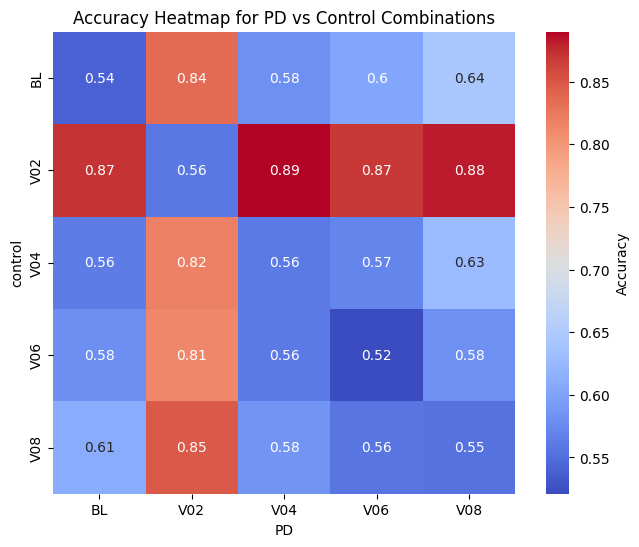

In [78]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

PD = []
Control= []
acc = []
for i,j in ACCURACY_DICT.items():
    PD.append(i.split('_')[1])
    Control.append(i.split('_')[-1])
    acc.append(j)


accuracy_table_pd_control = pd.DataFrame([PD,Control,acc]).T
accuracy_table_pd_control  = accuracy_table_pd_control.rename(columns = {0:'PD', 1:'control', 2: 'Accuracy'})

accuracy_table_pd_control['Accuracy'] = accuracy_table_pd_control['Accuracy'].astype(float)
heatmap_data_ = accuracy_table_pd_control.pivot(index="control", columns="PD", values="Accuracy")

# Plot the heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(heatmap_data_, annot=True, cmap="coolwarm", square=True, cbar_kws={'label': 'Accuracy'})
plt.title("Accuracy Heatmap for PD vs Control Combinations")
plt.savefig("../heatmaps_plots/accuracy_heatmaps/smaller_con_vs_pd_accuracy_heatmap.svg", format='svg')

plt.show()

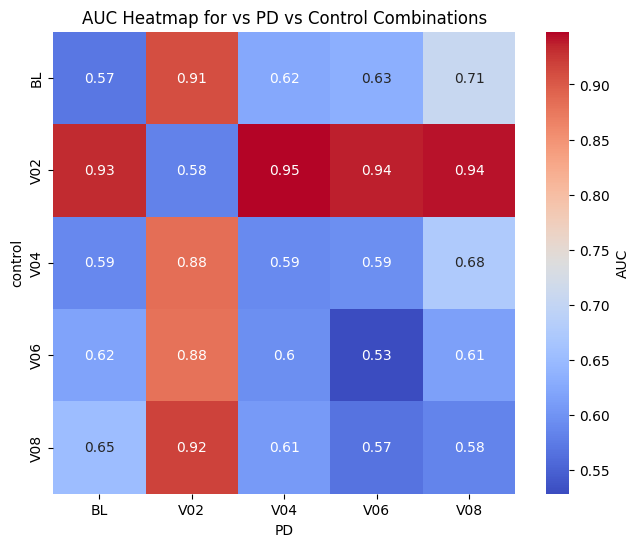

In [77]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

Control= []
PD= []
auc = []
for i,j in AUC_SCORES.items():
    PD.append(i.split('_')[1])
    Control.append(i.split('_')[-1])
    auc.append(j)


auc_table_pd_control  = pd.DataFrame([PD,Control,auc]).T
auc_table_pd_control  = auc_table_pd_control.rename(columns = {0:'PD', 1:'control', 2: 'AUC'})

auc_table_pd_control['AUC'] = auc_table_pd_control['AUC'].astype(float)
heatmap_data_ = auc_table_pd_control.pivot(index="control", columns="PD", values="AUC")

# Plot the heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(heatmap_data_, annot=True, cmap="coolwarm", square=True, cbar_kws={'label': 'AUC'})
plt.title("AUC Heatmap for vs PD vs Control Combinations")
plt.savefig("../heatmaps_plots/auc_heatmaps/smaller_con_vs_pd_auc_heatmap.svg", format='svg')

plt.show()

In [73]:
auc_table_pd_control

,PD,control,AUC
0,V08,V08,0.583521
1,BL,BL,0.705289
2,V04,V04,0.675056
3,V02,V02,0.941725
4,V06,V06,0.614180
5,V08,V08,0.652494
6,BL,BL,0.570265
7,V04,V04,0.587780
8,V02,V02,0.932015
9,V06,V06,0.616800


In [67]:
df_acc = pd.DataFrame(list(ACCURACY_DICT.items()), columns=['Comparison', 'Accuracy'])
df_auc = pd.DataFrame(list(AUC_SCORES.items()), columns=['Comparison', 'AUC'])
#df_f1  = pd.DataFrame(list(F1_SCORES.items()), columns=['Comparison', 'F1'])
df_precision = pd.DataFrame(list(PRECISION_SCORES.items()), columns=['Comparison', 'Precision'])
df_recall = pd.DataFrame(list(RECALL_SCORES.items()), columns=['Comparison', 'Recall'])

import pandas as pd
from functools import reduce

# List of DataFrames to merge
dfs = [df_acc, df_auc, df_precision, df_recall]

# Merge all DataFrames on 'Comparison'
df_all = reduce(lambda left, right: pd.merge(left, right, on='Comparison'), dfs)

df_all.to_csv('../metrics_csv_files/metrics_smaller_con_vs_pd.csv',index = False)

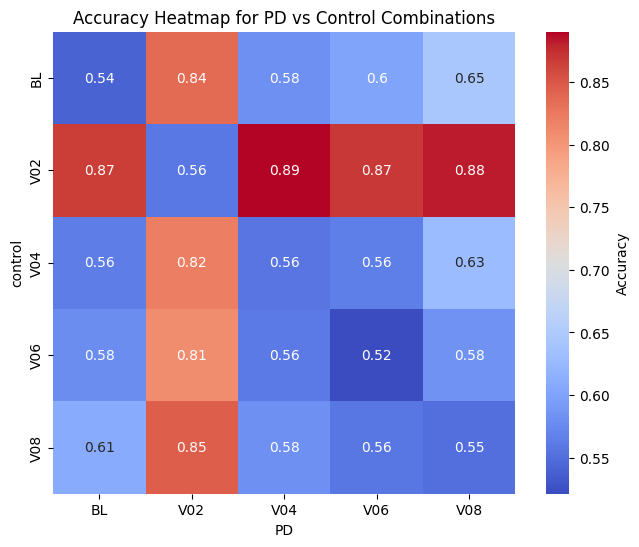

In [65]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

PD = []
Control= []
acc = []
for i,j in ACCURACY_DICT.items():
    PD.append(i.split('_')[1])
    Control.append(i.split('_')[-1])
    acc.append(j)


accuracy_table_pd_control = pd.DataFrame([PD,Control,acc]).T
accuracy_table_pd_control  = accuracy_table_pd_control.rename(columns = {0:'PD', 1:'control', 2: 'Accuracy'})

accuracy_table_pd_control['Accuracy'] = accuracy_table_pd_control['Accuracy'].astype(float)
heatmap_data_ = accuracy_table_pd_control.pivot(index="control", columns="PD", values="Accuracy")

# Plot the heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(heatmap_data_, annot=True, cmap="coolwarm", square=True, cbar_kws={'label': 'Accuracy'})
plt.title("Accuracy Heatmap for PD vs Control Combinations")
plt.show()

In [66]:
#FEATURE_IMPORTANCES['Prodromal_V08_Control_V08']
#sorted_0_dict_FEATURE_IMPORTANCES_asc = dict(sorted(FEATURE_IMPORTANCES['Prodromal_V08_Control_V08'].items(), key=lambda item: item[1]))

In [67]:
#sorted_0_dict_FEATURE_IMPORTANCES_asc

In [70]:
sorted_2_dict_FEATURE_IMPORTANCES_asc = dict(sorted(FEATURE_IMPORTANCES['PD_V08_Control_V08_1'].items(), key=lambda item: item[1]))
sorted_2_dict_FEATURE_IMPORTANCES_asc

{'ENSG00000114026': -0.917749228224786,
 'ENSG00000147400': -0.7650675431443061,
 'ENSG00000188486': -0.752395432438047,
 'ENSG00000104884': -0.6034240145659886,
 'ENSG00000076248': -0.5078563051622967,
 'ENSG00000076924': -0.470024420756291,
 'ENSG00000163161': -0.45485489438598176,
 'ENSG00000187736': -0.4246401125846683,
 'ENSG00000174405': -0.40833488265222245,
 'ENSG00000105486': -0.3945547597200957,
 'ENSG00000049167': -0.37524351061307387,
 'ENSG00000042088': -0.3234542975563857,
 'ENSG00000062822': -0.3148628902017761,
 'ENSG00000175595': -0.29842083670131114,
 'ENSG00000103152': -0.28968887261326326,
 'ENSG00000162585': -0.2765411996130801,
 'ENSG00000253729': -0.271905282683181,
 'ENSG00000163961': -0.2660770439261915,
 'ENSG00000152422': -0.26448019633943426,
 'ENSG00000152457': -0.2612221322825812,
 'ENSG00000253251': -0.24106178039450413,
 'ENSG00000179262': -0.23201801787283616,
 'ENSG00000067369': -0.22682077287076155,
 'ENSG00000132781': -0.2218413920579924,
 'ENSG00000

In [71]:
data.DIAGNOSIS.value_counts()

DIAGNOSIS
PD           1716
Control       869
Prodromal     254
Name: count, dtype: int64

In [72]:
data['DIAGNOSIS_2'] = data['DIAGNOSIS']

/tmp/ipykernel_2391/3022521848.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['DIAGNOSIS_2'] = data['DIAGNOSIS']


In [73]:
data['DIAGNOSIS'].replace({'Control': '1.Control', 'Prodromal': '2.Prodromal', 'PD': '3.PD'}, inplace=True)

/tmp/ipykernel_2391/960865595.py:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  data['DIAGNOSIS'].replace({'Control': '1.Control', 'Prodromal': '2.Prodromal', 'PD': '3.PD'}, inplace=True)
/tmp/ipykernel_2391/960865595.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['DIAGNOSIS'].replace({'Control': '1.Control', 'Prodromal': '2.Prodro

In [74]:
data['New_Time_Point'] = data['DIAGNOSIS'] + '_' + data['Time_Point']
data['New_Time_Point_2'] = data['DIAGNOSIS_2'] + '_' + data['Time_Point']

/tmp/ipykernel_2391/3372653969.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['New_Time_Point'] = data['DIAGNOSIS'] + '_' + data['Time_Point']
/tmp/ipykernel_2391/3372653969.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['New_Time_Point_2'] = data['DIAGNOSIS_2'] + '_' + data['Time_Point']


In [75]:
data = data.sort_values(by = 'New_Time_Point')

In [76]:
tmp_data = data[data.Time_Point !='V02']

In [77]:
tmp_data

,DIAGNOSIS,Patient_Name,Time_Point,ENSG00000170734,ENSG00000105486,ENSG00000198924,ENSG00000122376,ENSG00000106628,ENSG00000188486,ENSG00000154767,...,ENSG00000114026,ENSG00000154328,ENSG00000164306,ENSG00000005156,ENSG00000111358,ENSG00000172613,ENSG00000076924,DIAGNOSIS_2,New_Time_Point,New_Time_Point_2
2979,1.Control,4067,BL,4.407360,1.816110,1.430990,5.15529,2.514820,2.167010,23.67410,...,4.836210,4.683610,5.78732,6.09891,6.37008,3.867520,3.215900,Control,1.Control_BL,Control_BL
1675,1.Control,3555,BL,2.109830,3.103000,1.248520,4.43577,1.770070,0.913019,21.57520,...,4.137930,2.316600,7.58490,6.36584,4.31114,2.900280,2.991620,Control,1.Control_BL,Control_BL
1672,1.Control,3554,BL,2.406540,3.274510,1.456730,5.94589,2.301330,1.088630,13.97770,...,4.643620,1.941440,7.31071,6.44876,4.60632,4.330180,3.413750,Control,1.Control_BL,Control_BL
1663,1.Control,3551,BL,3.472790,4.087010,2.419140,8.17424,3.790770,3.083490,27.41430,...,7.491670,3.922670,12.11110,12.00800,9.43585,8.730820,4.493290,Control,1.Control_BL,Control_BL
1844,1.Control,3614,BL,2.106320,1.749620,1.440770,5.12512,1.348400,2.695560,11.35320,...,3.569420,1.738670,7.99291,4.37542,5.48720,2.733700,2.016200,Control,1.Control_BL,Control_BL
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1047,3.PD,3352,V08,0.850344,0.485638,0.654625,1.38863,0.547717,0.644353,6.29598,...,0.890893,0.908831,1.69835,1.46049,1.63987,0.926721,0.852898,PD,3.PD_V08,PD_V08
3260,3.PD,4099,V08,3.177690,2.090720,1.449480,5.36266,1.725000,1.597810,25.60230,...,3.362820,2.540580,9.26247,8.73973,10.13750,3.225290,2.655750,PD,3.PD_V08,PD_V08
578,3.PD,3154,V08,2.831450,1.873300,1.777750,6.47733,2.313710,1.559130,23.47330,...,3.823230,3.269720,6.21250,7.30405,6.85926,2.956030,2.670000,PD,3.PD_V08,PD_V08
1992,3.PD,3700,V08,3.371200,2.047790,1.575550,5.18226,1.297220,1.753470,15.38130,...,3.235300,2.223160,7.56176,4.31062,5.70239,2.444230,1.957800,PD,3.PD_V08,PD_V08


In [78]:
df = pd.DataFrame(sorted_2_dict_FEATURE_IMPORTANCES_asc.items())
df[2] = np.abs(df[1])
df = df.sort_values(by = 2, ascending=False)
df

,0,1,2
95,ENSG00000188827,1.080540,1.080540
0,ENSG00000114026,-0.917749,0.917749
1,ENSG00000147400,-0.765068,0.765068
94,ENSG00000073050,0.758372,0.758372
2,ENSG00000188486,-0.752395,0.752395
...,...,...,...
55,ENSG00000145736,0.006787,0.006787
54,ENSG00000177084,0.004173,0.004173
51,ENSG00000166169,-0.002222,0.002222
52,ENSG00000122008,-0.001638,0.001638


In [79]:
tmp_data

,DIAGNOSIS,Patient_Name,Time_Point,ENSG00000170734,ENSG00000105486,ENSG00000198924,ENSG00000122376,ENSG00000106628,ENSG00000188486,ENSG00000154767,...,ENSG00000114026,ENSG00000154328,ENSG00000164306,ENSG00000005156,ENSG00000111358,ENSG00000172613,ENSG00000076924,DIAGNOSIS_2,New_Time_Point,New_Time_Point_2
2979,1.Control,4067,BL,4.407360,1.816110,1.430990,5.15529,2.514820,2.167010,23.67410,...,4.836210,4.683610,5.78732,6.09891,6.37008,3.867520,3.215900,Control,1.Control_BL,Control_BL
1675,1.Control,3555,BL,2.109830,3.103000,1.248520,4.43577,1.770070,0.913019,21.57520,...,4.137930,2.316600,7.58490,6.36584,4.31114,2.900280,2.991620,Control,1.Control_BL,Control_BL
1672,1.Control,3554,BL,2.406540,3.274510,1.456730,5.94589,2.301330,1.088630,13.97770,...,4.643620,1.941440,7.31071,6.44876,4.60632,4.330180,3.413750,Control,1.Control_BL,Control_BL
1663,1.Control,3551,BL,3.472790,4.087010,2.419140,8.17424,3.790770,3.083490,27.41430,...,7.491670,3.922670,12.11110,12.00800,9.43585,8.730820,4.493290,Control,1.Control_BL,Control_BL
1844,1.Control,3614,BL,2.106320,1.749620,1.440770,5.12512,1.348400,2.695560,11.35320,...,3.569420,1.738670,7.99291,4.37542,5.48720,2.733700,2.016200,Control,1.Control_BL,Control_BL
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1047,3.PD,3352,V08,0.850344,0.485638,0.654625,1.38863,0.547717,0.644353,6.29598,...,0.890893,0.908831,1.69835,1.46049,1.63987,0.926721,0.852898,PD,3.PD_V08,PD_V08
3260,3.PD,4099,V08,3.177690,2.090720,1.449480,5.36266,1.725000,1.597810,25.60230,...,3.362820,2.540580,9.26247,8.73973,10.13750,3.225290,2.655750,PD,3.PD_V08,PD_V08
578,3.PD,3154,V08,2.831450,1.873300,1.777750,6.47733,2.313710,1.559130,23.47330,...,3.823230,3.269720,6.21250,7.30405,6.85926,2.956030,2.670000,PD,3.PD_V08,PD_V08
1992,3.PD,3700,V08,3.371200,2.047790,1.575550,5.18226,1.297220,1.753470,15.38130,...,3.235300,2.223160,7.56176,4.31062,5.70239,2.444230,1.957800,PD,3.PD_V08,PD_V08


In [80]:
tmp_data.New_Time_Point_2.unique()

array(['Control_BL', 'Control_V04', 'Control_V06', 'Control_V08',
       'Prodromal_BL', 'Prodromal_V04', 'Prodromal_V06', 'Prodromal_V08',
       'PD_BL', 'PD_V04', 'PD_V06', 'PD_V08'], dtype=object)

In [81]:
genes = df[0].values.tolist()

In [82]:
control_tmp_data = tmp_data[tmp_data['New_Time_Point_2'].str.startswith('Control')]
control_tmp_data = control_tmp_data.sort_values(by = 'New_Time_Point') 
control_tmp_data

,DIAGNOSIS,Patient_Name,Time_Point,ENSG00000170734,ENSG00000105486,ENSG00000198924,ENSG00000122376,ENSG00000106628,ENSG00000188486,ENSG00000154767,...,ENSG00000114026,ENSG00000154328,ENSG00000164306,ENSG00000005156,ENSG00000111358,ENSG00000172613,ENSG00000076924,DIAGNOSIS_2,New_Time_Point,New_Time_Point_2
2979,1.Control,4067,BL,4.40736,1.816110,1.430990,5.15529,2.514820,2.16701,23.67410,...,4.83621,4.683610,5.78732,6.09891,6.37008,3.86752,3.215900,Control,1.Control_BL,Control_BL
497,1.Control,3114,BL,3.38548,2.550140,0.451244,2.68004,1.815940,1.67938,20.10660,...,5.26165,2.411470,5.25938,7.00288,3.71713,3.88857,2.594400,Control,1.Control_BL,Control_BL
782,1.Control,3222,BL,2.11368,1.167760,0.774399,3.91154,0.685047,1.56282,13.13140,...,2.31834,0.987221,4.65817,4.14971,3.42814,2.13310,1.657400,Control,1.Control_BL,Control_BL
777,1.Control,3221,BL,2.11489,2.799460,1.468540,4.84390,2.428000,2.99522,17.84210,...,4.97410,2.646960,7.68997,6.94779,6.20524,4.82345,3.519980,Control,1.Control_BL,Control_BL
596,1.Control,3161,BL,1.50143,0.841781,0.579998,2.58857,1.587990,2.06143,13.53100,...,2.65527,1.913360,3.60128,3.44844,4.07475,1.12936,1.915930,Control,1.Control_BL,Control_BL
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1090,1.Control,3361,V08,2.32156,2.408120,0.777736,2.42904,1.429940,1.93902,26.48050,...,4.18232,2.817890,6.28531,4.81919,4.63190,4.08928,2.600460,Control,1.Control_V08,Control_V08
1722,1.Control,3570,V08,2.19212,1.152550,1.863360,4.81438,1.549400,1.23865,20.16990,...,4.54428,1.986960,7.37626,7.12054,5.14603,3.54093,3.160430,Control,1.Control_V08,Control_V08
1598,1.Control,3523,V08,2.15892,0.522038,0.780601,3.38469,1.118740,1.42874,7.10271,...,2.02114,1.198660,5.42830,2.40629,2.92016,1.07575,0.695205,Control,1.Control_V08,Control_V08
2498,1.Control,3950,V08,2.44580,2.822360,0.775876,2.94086,2.880710,1.22477,25.36210,...,5.29185,2.167200,5.40553,8.24968,3.81716,6.68045,5.441090,Control,1.Control_V08,Control_V08


In [83]:
def return_gene_name(ensembleid):

    try:
        return results[results['Gene stable ID'] == ensembleid]['Gene name'].values[0]
    except:
        print(ensembleid)
        return ensembleid


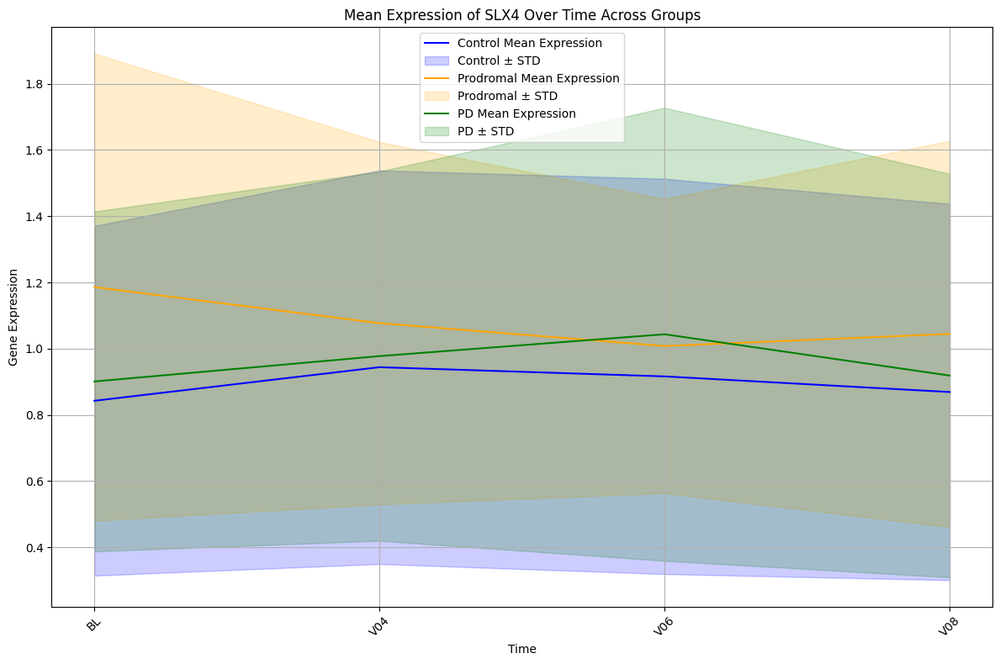

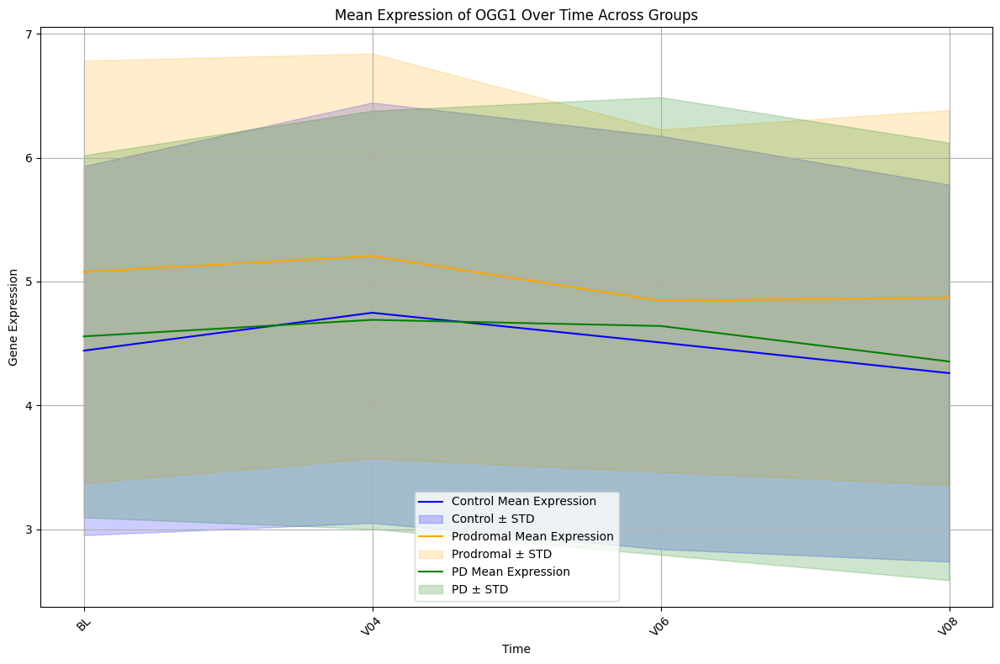

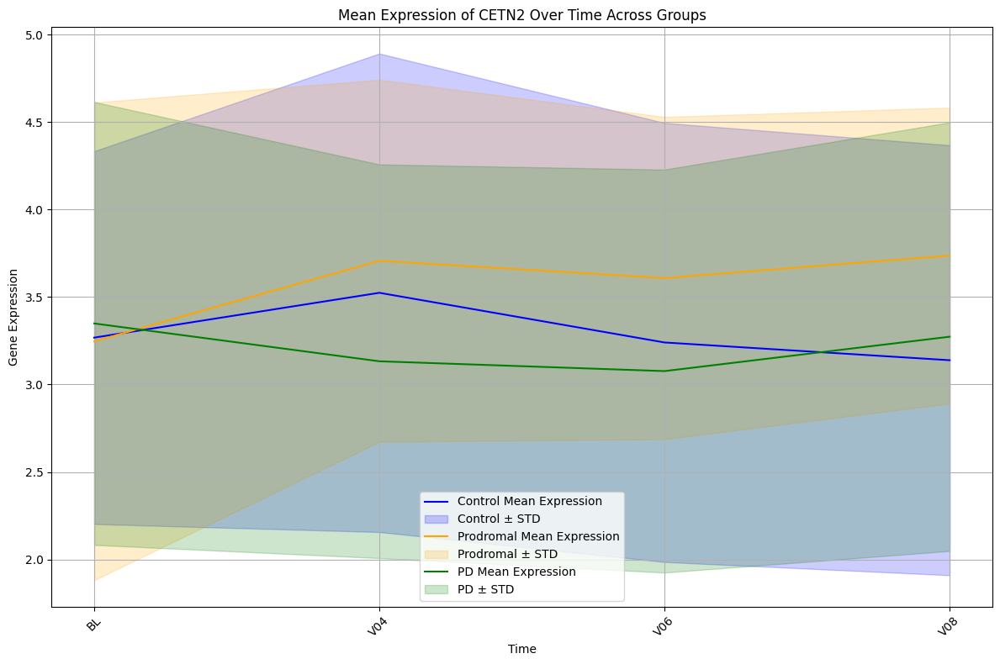

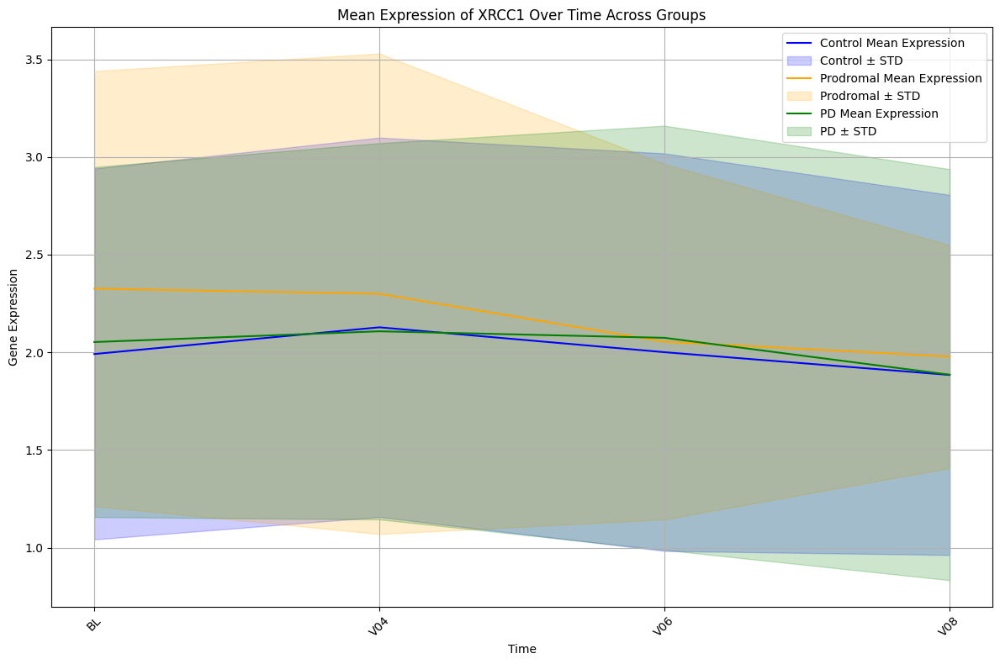

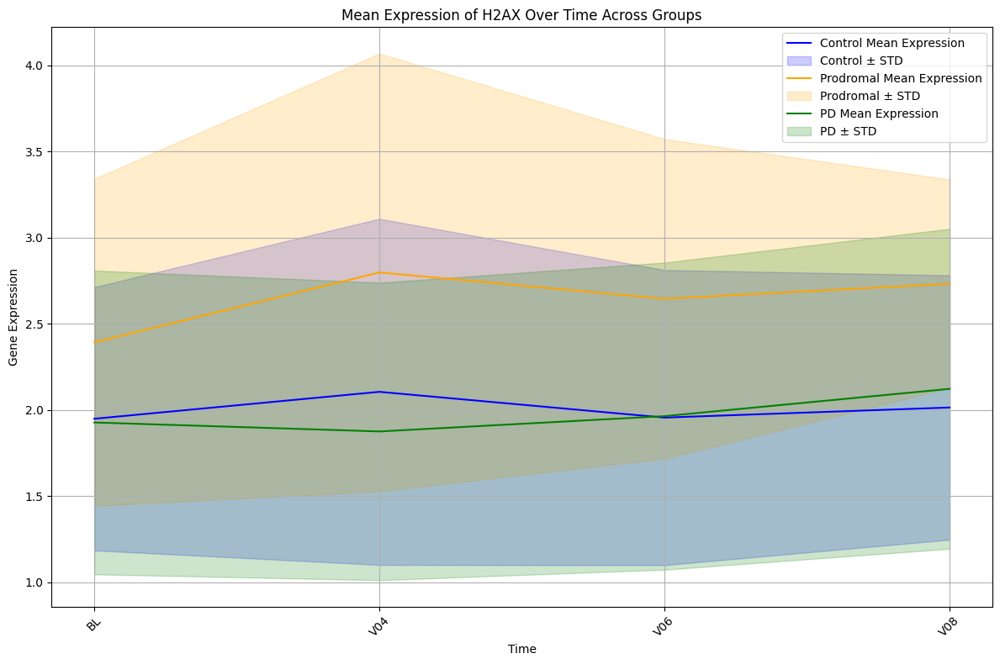

...

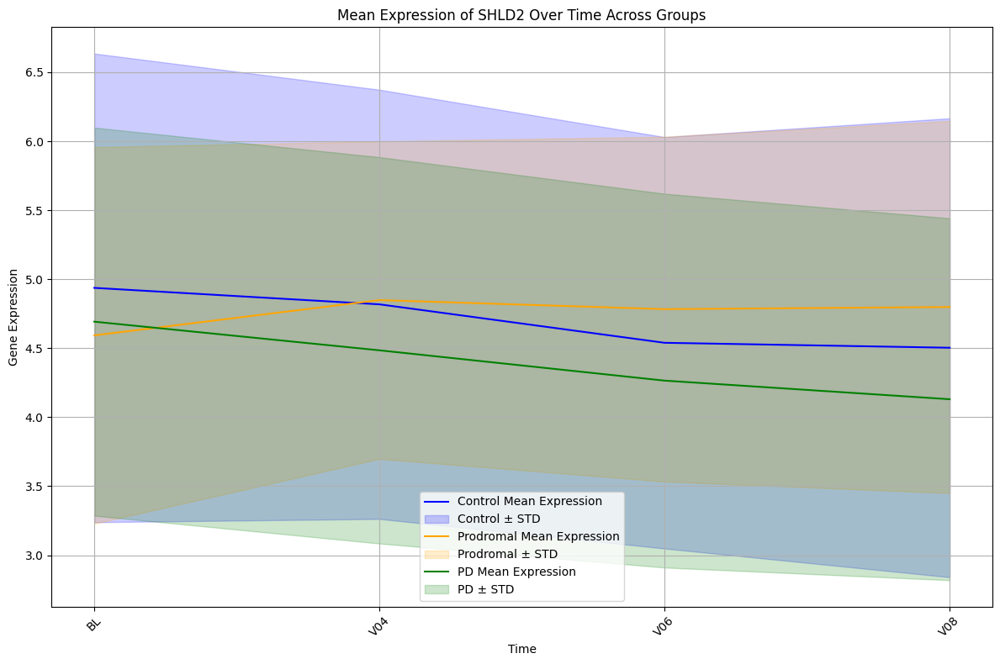

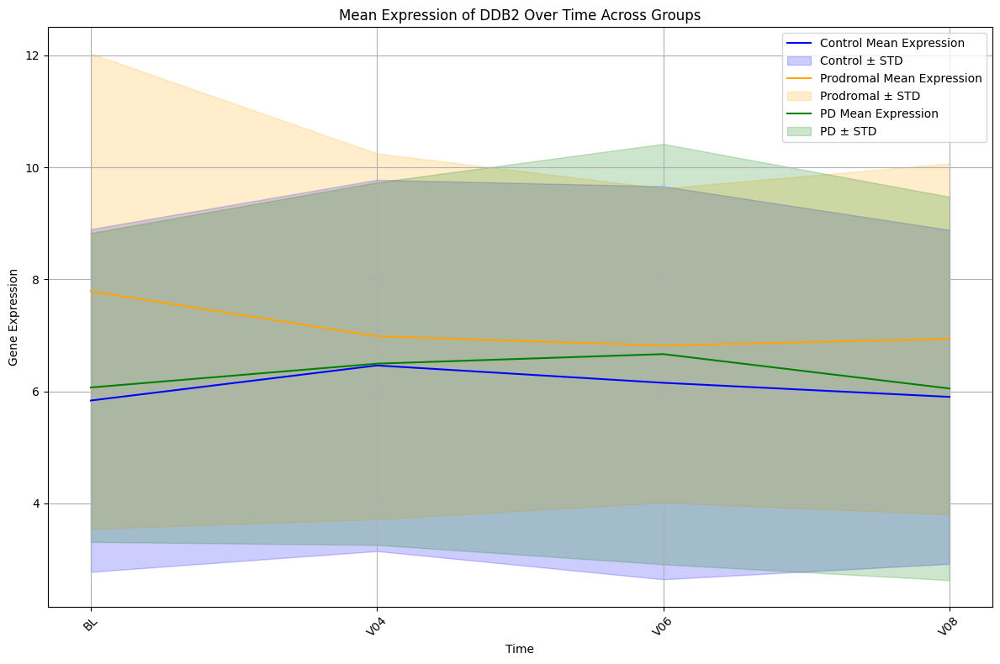

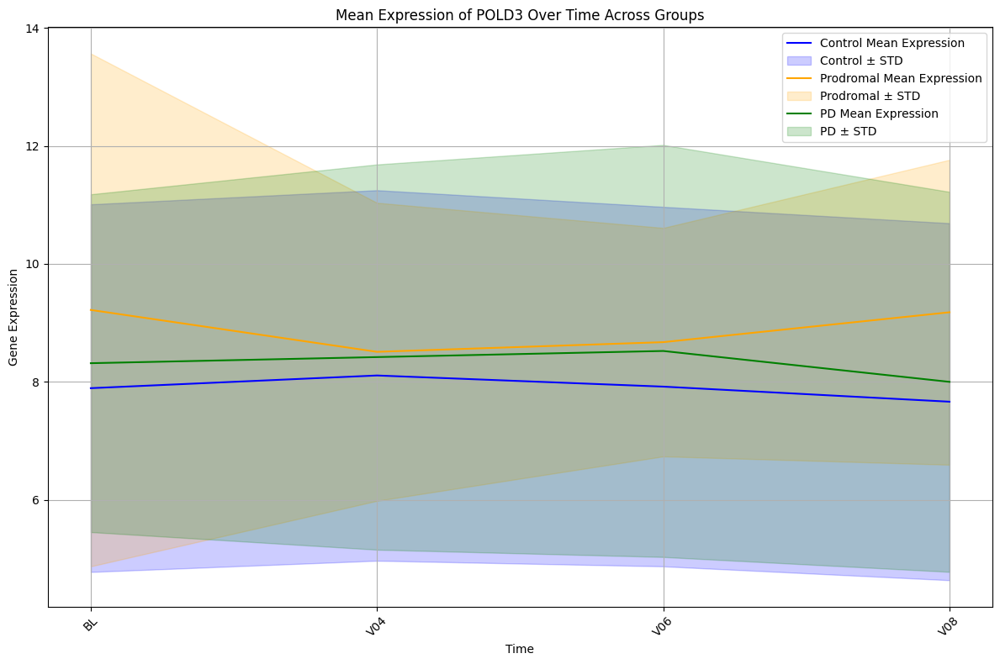

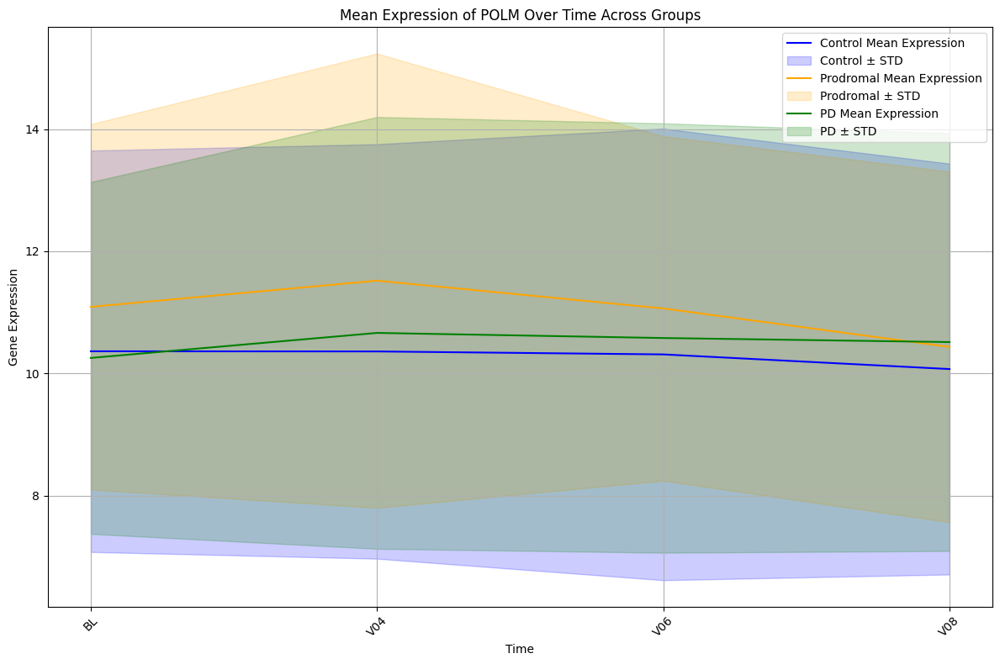

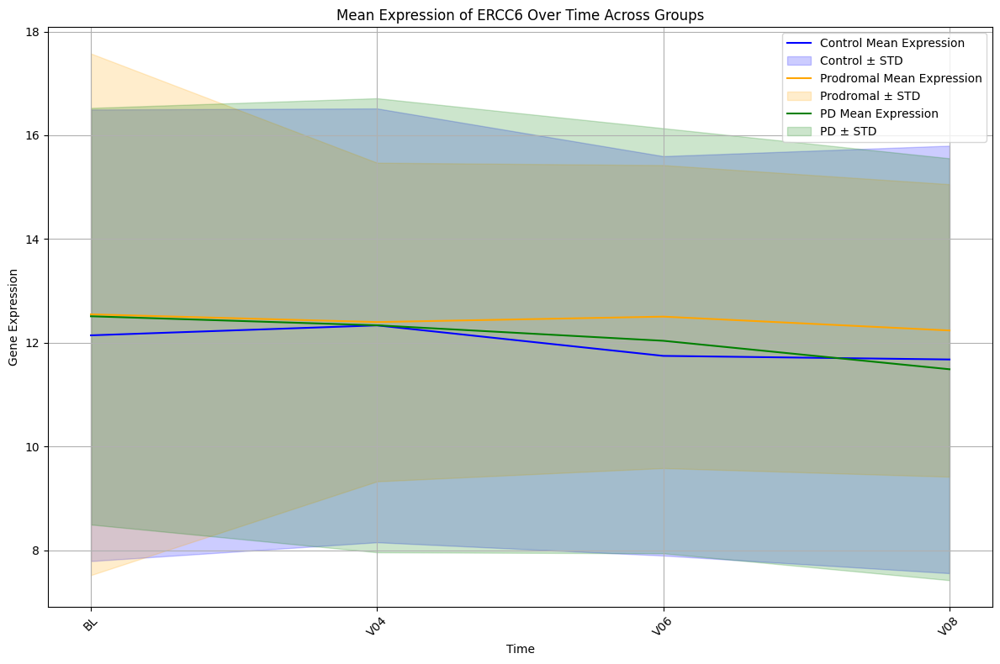

ENSG00000163840


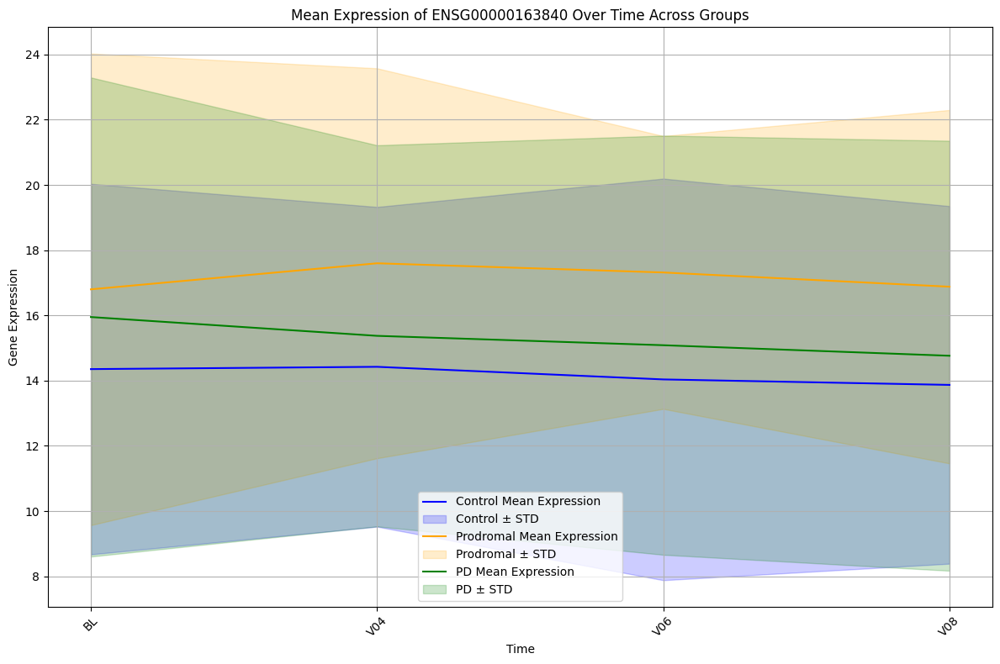

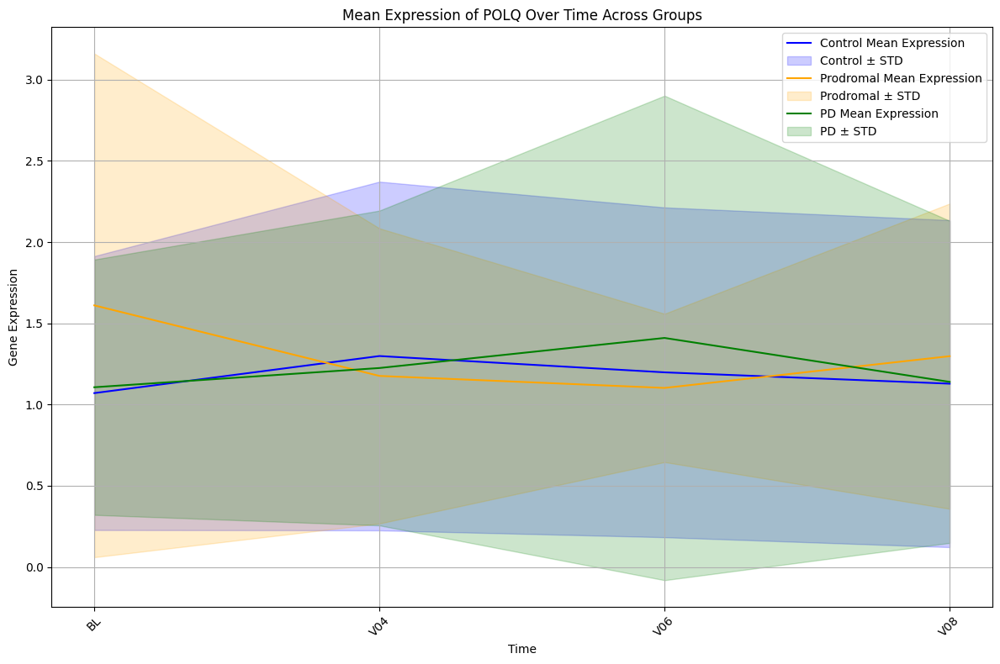

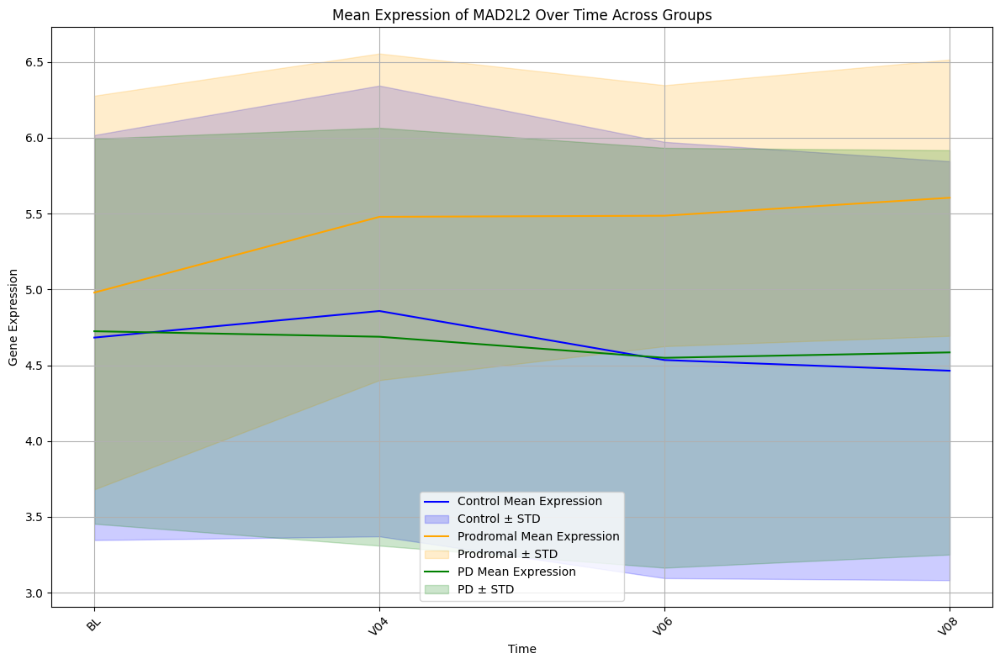

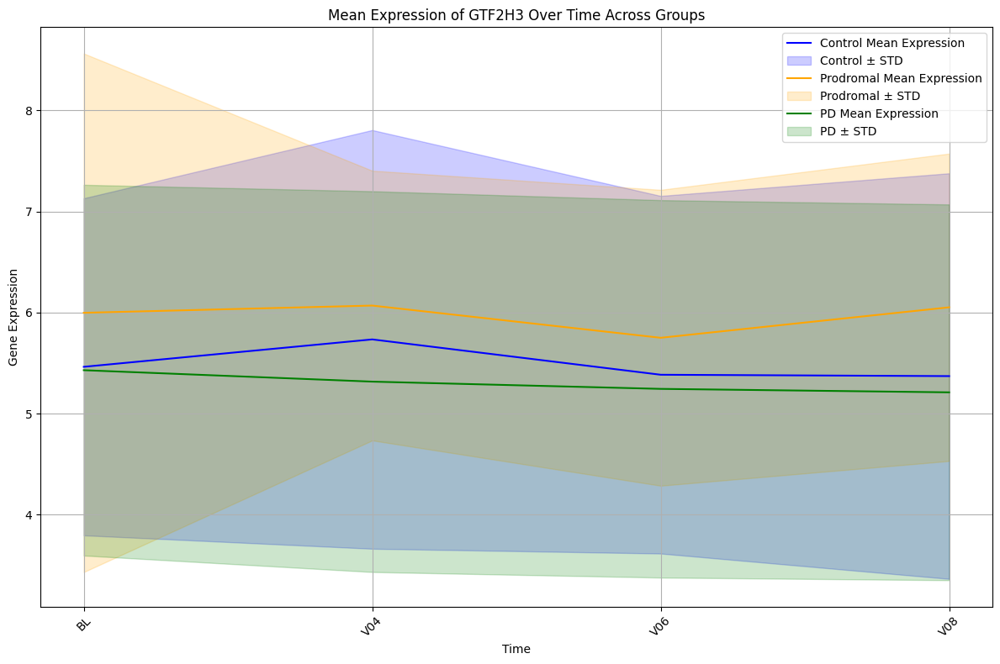

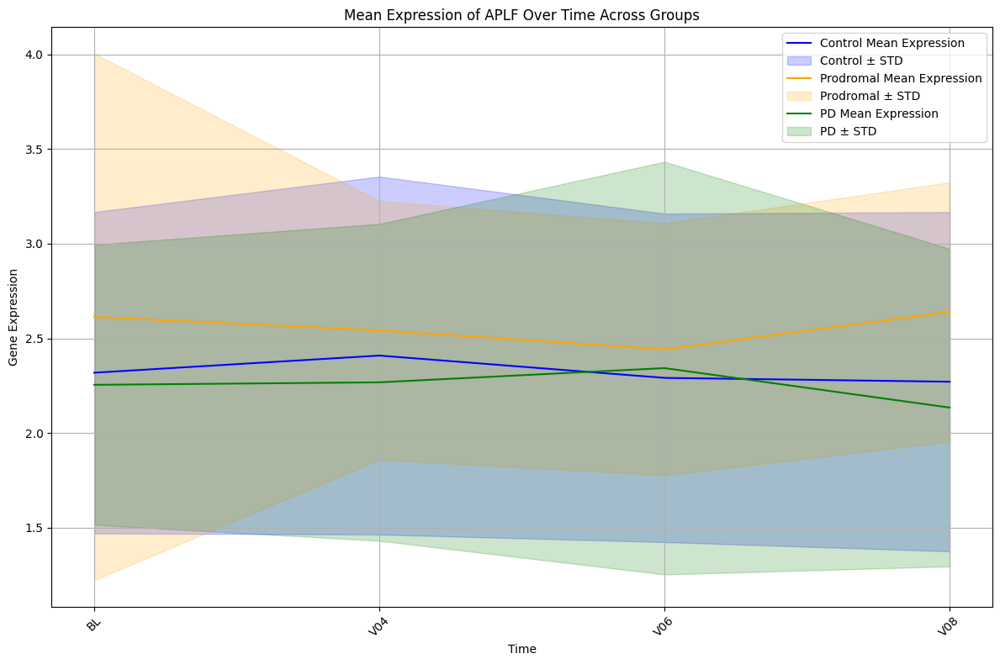

...

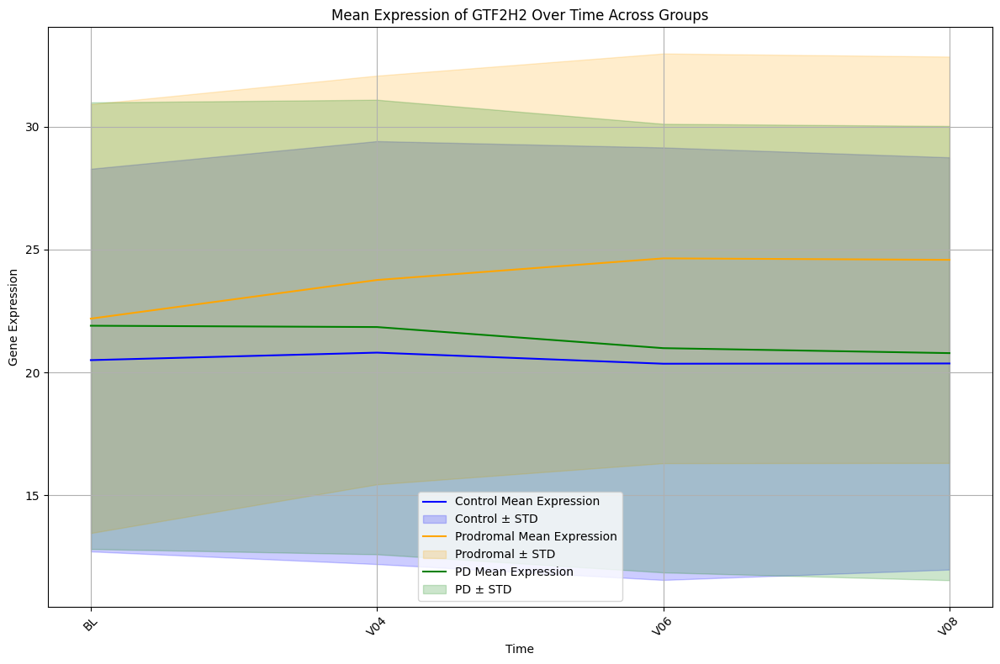

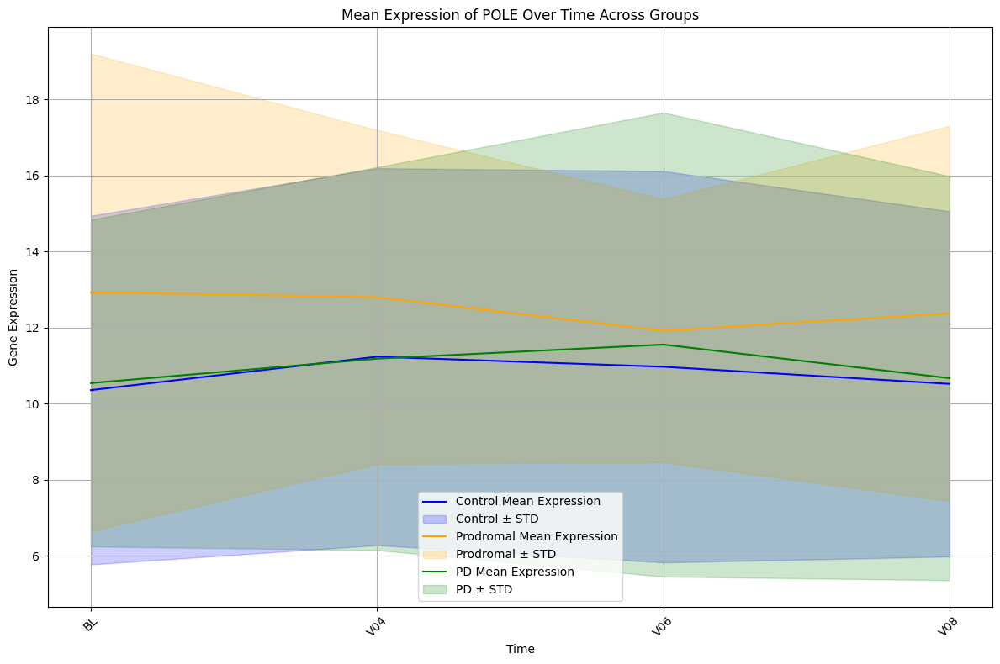

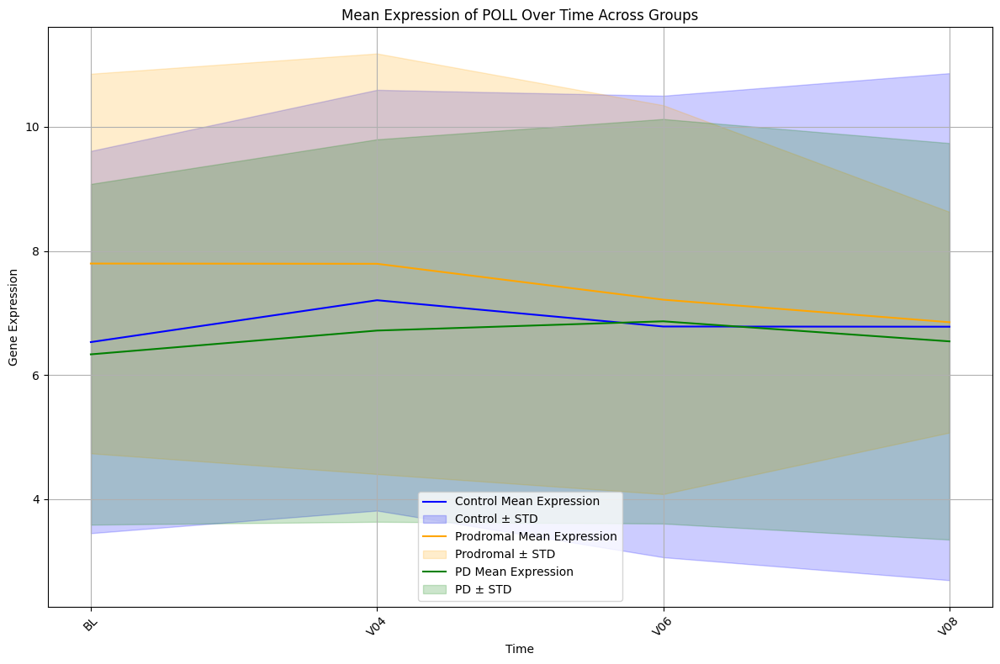

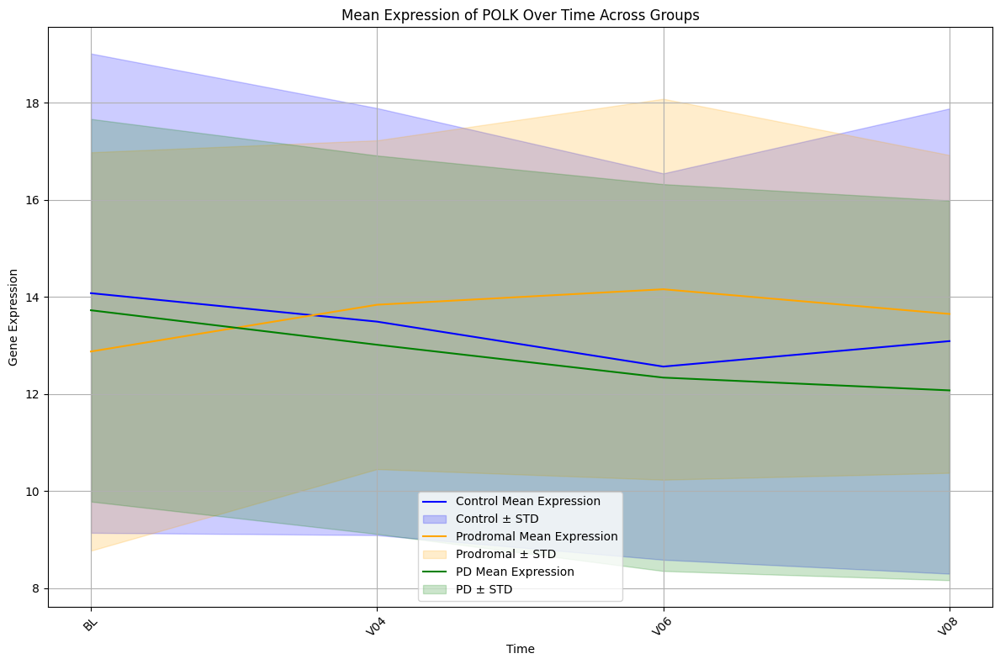

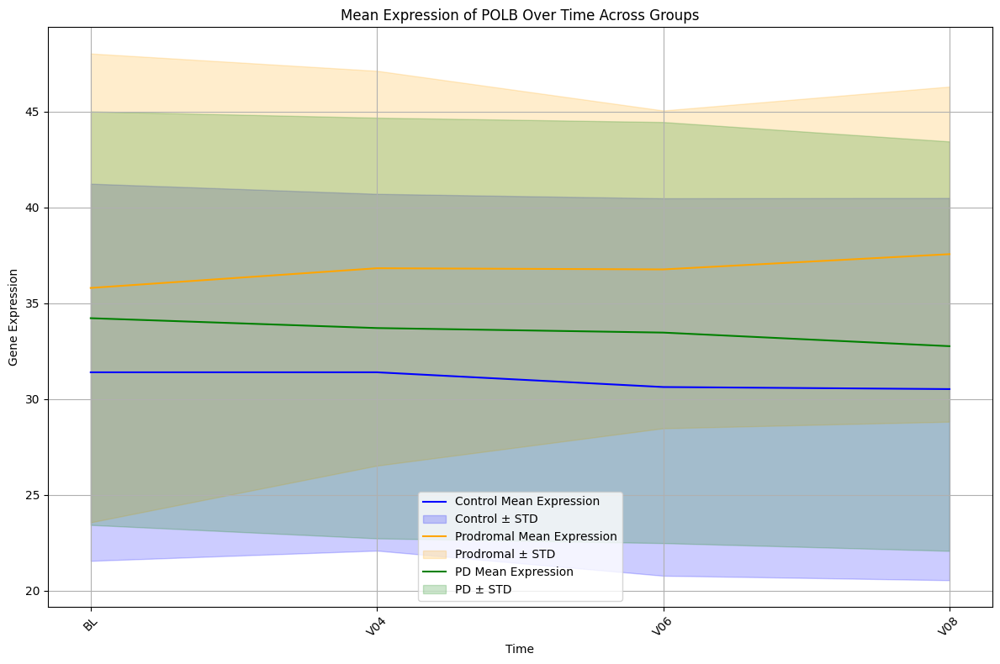

In [84]:
import matplotlib.pyplot as plt

# Loop through each gene
for gene in genes:
    # Create a new figure for each gene
    plt.figure(figsize=(12, 8))
    
    # Define a list to store the group data
    groups = ['Control', 'Prodromal', 'PD']
    colors = {'Control': 'blue', 'Prodromal': 'orange', 'PD': 'green'}
    
    for group in groups:
        # Filter and sort data by group
        group_tmp_data = tmp_data[tmp_data['New_Time_Point_2'].str.startswith(group)]
        group_tmp_data = group_tmp_data.sort_values(by='New_Time_Point')
        
        # Calculate mean and standard deviation
        mean_expression = group_tmp_data.groupby('New_Time_Point')[gene].mean()
        std_expression = group_tmp_data.groupby('New_Time_Point')[gene].std()
        
        # Extract clean time points
        index = [i.split('_')[1] for i in mean_expression.index]
        
        # Plot mean expression
        plt.plot(index, mean_expression, color=colors[group], label=f'{group} Mean Expression')
        
        # Fill the standard deviation area
        plt.fill_between(index,
                         mean_expression - std_expression,
                         mean_expression + std_expression,
                         color=colors[group], alpha=0.2, label=f'{group} ± STD')
    
    # Customize plot
    plt.xlabel('Time')
    plt.ylabel('Gene Expression')
    gene  = return_gene_name(gene)
    plt.title(f'Mean Expression of {gene} Over Time Across Groups')
    plt.xticks(rotation=45)
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    
    # Show the plot
    plt.show()



### 6. Expression of Genes with time 

In [85]:
FEATURE_IMPORTANCES.keys()

dict_keys(['PD_BL_Control_BL_0', 'PD_BL_Control_BL_1', 'PD_BL_Control_BL_2', 'PD_BL_Control_BL_3', 'PD_BL_Control_BL_4', 'PD_BL_Control_BL_5', 'PD_BL_Control_BL_6', 'PD_BL_Control_BL_7', 'PD_BL_Control_BL_8', 'PD_BL_Control_BL_9', 'PD_BL_Control_BL_10', 'PD_BL_Control_BL_11', 'PD_BL_Control_BL_12', 'PD_BL_Control_BL_13', 'PD_BL_Control_BL_14', 'PD_BL_Control_BL_15', 'PD_BL_Control_BL_16', 'PD_BL_Control_BL_17', 'PD_BL_Control_BL_18', 'PD_BL_Control_BL_19', 'PD_BL_Control_BL_20', 'PD_BL_Control_BL_21', 'PD_BL_Control_BL_22', 'PD_BL_Control_BL_23', 'PD_BL_Control_BL_24', 'PD_BL_Control_BL_25', 'PD_BL_Control_BL_26', 'PD_BL_Control_BL_27', 'PD_BL_Control_BL_28', 'PD_BL_Control_BL_29', 'PD_BL_Control_BL_30', 'PD_BL_Control_BL_31', 'PD_BL_Control_BL_32', 'PD_BL_Control_BL_33', 'PD_BL_Control_BL_34', 'PD_BL_Control_BL_35', 'PD_BL_Control_BL_36', 'PD_BL_Control_BL_37', 'PD_BL_Control_BL_38', 'PD_BL_Control_BL_39', 'PD_BL_Control_BL_40', 'PD_BL_Control_BL_41', 'PD_BL_Control_BL_42', 'PD_BL_Con

In [87]:
FEATURE_IMPORTANCES['PD_V04_Control_V04_153']

{'ENSG00000170734': -0.09093045351201091,
 'ENSG00000105486': -0.04383067459166919,
 'ENSG00000198924': 0.5889363501021777,
 'ENSG00000122376': -0.03885678534855129,
 'ENSG00000106628': 0.17917771120950302,
 'ENSG00000188486': -0.29496932811981114,
 'ENSG00000154767': 0.0861863398857218,
 'ENSG00000168496': 0.821302842035604,
 'ENSG00000213780': 0.1249433511569773,
 'ENSG00000073050': 0.3956120712559822,
 'ENSG00000112130': -0.808603459155415,
 'ENSG00000253251': 0.3716443094615688,
 'ENSG00000140398': -0.08354730424658705,
 'ENSG00000056050': 0.11956639128801258,
 'ENSG00000169188': 0.13836305774487356,
 'ENSG00000009413': 0.04303977828343851,
 'ENSG00000042088': -0.2728055065654557,
 'ENSG00000163961': -0.4687212403451097,
 'ENSG00000167986': 0.17191147912899518,
 'ENSG00000122678': 0.2008822089012871,
 'ENSG00000070501': -0.023789460023831213,
 'ENSG00000049167': 0.25021703046334437,
 'ENSG00000116670': -0.10513117859833272,
 'ENSG00000104884': 0.4778802569130915,
 'ENSG00000100823'

In [98]:
compare_list = ['PD_BL_Control_BL',  'PD_V02_Control_V02' ,'PD_V04_Control_V04', 'PD_V06_Control_V06', 'PD_V08_Control_V08']

In [88]:
FEATURE_IMPORTANCES_PD_BL_Control_BL = dict()
FEATURE_IMPORTANCES_PD_V02_Control_V02 = dict()
FEATURE_IMPORTANCES_PD_V04_Control_V04 = dict()
FEATURE_IMPORTANCES_PD_V06_Control_V06 = dict()
FEATURE_IMPORTANCES_PD_V08_Control_V08 = dict()

for i in FEATURE_IMPORTANCES.keys():
    if 'PD_BL_Control_BL' in i:
        FEATURE_IMPORTANCES_PD_BL_Control_BL[i] = FEATURE_IMPORTANCES[i]

    elif 'PD_V02_Control_V02' in i:
        FEATURE_IMPORTANCES_PD_V02_Control_V02[i] = FEATURE_IMPORTANCES[i]

    elif 'PD_V04_Control_V04' in i:
        FEATURE_IMPORTANCES_PD_V04_Control_V04[i] = FEATURE_IMPORTANCES[i]

    elif 'PD_V06_Control_V06' in i:
        FEATURE_IMPORTANCES_PD_V06_Control_V06[i] = FEATURE_IMPORTANCES[i]

    elif 'PD_V08_Control_V08' in i:
        FEATURE_IMPORTANCES_PD_V08_Control_V08[i] = FEATURE_IMPORTANCES[i]
        
        

In [89]:
list(FEATURE_IMPORTANCES_PD_BL_Control_BL.keys())[:10]

['PD_BL_Control_BL_0',
 'PD_BL_Control_BL_1',
 'PD_BL_Control_BL_2',
 'PD_BL_Control_BL_3',
 'PD_BL_Control_BL_4',
 'PD_BL_Control_BL_5',
 'PD_BL_Control_BL_6',
 'PD_BL_Control_BL_7',
 'PD_BL_Control_BL_8',
 'PD_BL_Control_BL_9']

In [90]:
genes_list = list(FEATURE_IMPORTANCES_PD_BL_Control_BL['PD_BL_Control_BL_0'].keys())

In [91]:
genes_list[0:10]

['ENSG00000170734',
 'ENSG00000105486',
 'ENSG00000198924',
 'ENSG00000122376',
 'ENSG00000106628',
 'ENSG00000188486',
 'ENSG00000154767',
 'ENSG00000168496',
 'ENSG00000213780',
 'ENSG00000073050']

In [92]:
len(FEATURE_IMPORTANCES_PD_BL_Control_BL.keys())

1000

In [94]:
AVG_FEATURE_IMPORTANCES_PD_BL_Control_BL = dict()
for i in genes_list:
    s = 0
    for k in FEATURE_IMPORTANCES_PD_BL_Control_BL.keys():
        s += FEATURE_IMPORTANCES_PD_BL_Control_BL[k][i]
    s = s/len(FEATURE_IMPORTANCES_PD_BL_Control_BL.keys())
    AVG_FEATURE_IMPORTANCES_PD_BL_Control_BL[i] = s


AVG_FEATURE_IMPORTANCES_PD_V02_Control_V02 = dict()
for i in genes_list:
    s = 0
    for k in FEATURE_IMPORTANCES_PD_V02_Control_V02.keys():
        s += FEATURE_IMPORTANCES_PD_V02_Control_V02[k][i]
    s = s/len(FEATURE_IMPORTANCES_PD_V02_Control_V02.keys())
    AVG_FEATURE_IMPORTANCES_PD_V02_Control_V02[i] = s


AVG_FEATURE_IMPORTANCES_PD_V04_Control_V04 = dict()
for i in genes_list:
    s = 0
    for k in FEATURE_IMPORTANCES_PD_V04_Control_V04.keys():
        s += FEATURE_IMPORTANCES_PD_V04_Control_V04[k][i]
    s = s/len(FEATURE_IMPORTANCES_PD_V04_Control_V04.keys())
    AVG_FEATURE_IMPORTANCES_PD_V04_Control_V04[i] = s


AVG_FEATURE_IMPORTANCES_PD_V06_Control_V06 = dict()
for i in genes_list:
    s = 0
    for k in FEATURE_IMPORTANCES_PD_V06_Control_V06.keys():
        s += FEATURE_IMPORTANCES_PD_V06_Control_V06[k][i]
    s = s/len(FEATURE_IMPORTANCES_PD_V06_Control_V06.keys())
    AVG_FEATURE_IMPORTANCES_PD_V06_Control_V06[i] = s


AVG_FEATURE_IMPORTANCES_PD_V08_Control_V08 = dict()
for i in genes_list:
    s = 0
    for k in FEATURE_IMPORTANCES_PD_V08_Control_V08.keys():
        s += FEATURE_IMPORTANCES_PD_V08_Control_V08[k][i]
    s = s/len(FEATURE_IMPORTANCES_PD_V08_Control_V08.keys())
    AVG_FEATURE_IMPORTANCES_PD_V08_Control_V08[i] = s
      

In [1]:
AVG_FEATURE_IMPORTANCES_PD_BL_Control_BL

NameError: name 'AVG_FEATURE_IMPORTANCES_PD_BL_Control_BL' is not defined

In [96]:
AVG_FEATURE_IMPORTANCES_PD_V02_Control_V02

{'ENSG00000170734': -0.575448957746404,
 'ENSG00000105486': -0.047614156647100905,
 'ENSG00000198924': -0.15010431780673186,
 'ENSG00000122376': 0.21548530405438626,
 'ENSG00000106628': 0.0681142421896128,
 'ENSG00000188486': -0.04014920654981364,
 'ENSG00000154767': 0.05666681569600227,
 'ENSG00000168496': 0.3960019740148084,
 'ENSG00000213780': 0.34000916855737445,
 'ENSG00000073050': -0.19856363344395922,
 'ENSG00000112130': -0.20187602765487256,
 'ENSG00000253251': -0.07959642009890276,
 'ENSG00000140398': -0.29776629517293124,
 'ENSG00000056050': -0.046279931482873675,
 'ENSG00000169188': -0.3798708331684642,
 'ENSG00000009413': 0.242403302638656,
 'ENSG00000042088': -0.15658917660158322,
 'ENSG00000163961': -0.4393518275461907,
 'ENSG00000167986': -0.012451303150109864,
 'ENSG00000122678': -0.07774091794261012,
 'ENSG00000070501': -0.07666320281692282,
 'ENSG00000049167': -0.39896585415358465,
 'ENSG00000116670': 0.189409375023924,
 'ENSG00000104884': 0.09729999912095695,
 'ENSG0

In [99]:
compare_list

['PD_BL_Control_BL',
 'PD_V02_Control_V02',
 'PD_V04_Control_V04',
 'PD_V06_Control_V06',
 'PD_V08_Control_V08']

In [100]:
FEATURE_IMPORTANCES_MERGE = dict()
FEATURE_IMPORTANCES_MERGE['PD_BL_Control_BL'] = AVG_FEATURE_IMPORTANCES_PD_BL_Control_BL
FEATURE_IMPORTANCES_MERGE['PD_V02_Control_V02'] = AVG_FEATURE_IMPORTANCES_PD_V02_Control_V02
FEATURE_IMPORTANCES_MERGE['PD_V04_Control_V04'] = AVG_FEATURE_IMPORTANCES_PD_V04_Control_V04
FEATURE_IMPORTANCES_MERGE['PD_V06_Control_V06'] = AVG_FEATURE_IMPORTANCES_PD_V06_Control_V06
FEATURE_IMPORTANCES_MERGE['PD_V08_Control_V08'] = AVG_FEATURE_IMPORTANCES_PD_V08_Control_V08


In [101]:
pd.DataFrame(FEATURE_IMPORTANCES_MERGE['PD_BL_Control_BL'].items())

,0,1
0,ENSG00000170734,-0.319455
1,ENSG00000105486,-0.337050
2,ENSG00000198924,-1.079308
3,ENSG00000122376,0.429220
4,ENSG00000106628,0.648060
...,...,...
91,ENSG00000164306,-0.345782
92,ENSG00000005156,0.312038
93,ENSG00000111358,-0.128692
94,ENSG00000172613,0.110823


In [102]:
ranking_of_features = []
for i in compare_list:


    df = pd.DataFrame(FEATURE_IMPORTANCES_MERGE[i].items())
    df[2] = np.abs(df[1])
    df = df.sort_values(by = 2, ascending=False)
    print(df)
    ranking_of_features.append(df[0].tolist())


                  0         1         2
2   ENSG00000198924 -1.079308  1.079308
45  ENSG00000041880 -0.779647  0.779647
84  ENSG00000169621  0.722295  0.722295
23  ENSG00000104884  0.721116  0.721116
4   ENSG00000106628  0.648060  0.648060
..              ...       ...       ...
59  ENSG00000012061  0.006539  0.006539
66  ENSG00000174405  0.004882  0.004882
63  ENSG00000080345 -0.002545  0.002545
26  ENSG00000110768  0.001379  0.001379
14  ENSG00000169188 -0.000495  0.000495

[96 rows x 3 columns]
                  0         1         2
46  ENSG00000148229  0.630842  0.630842
0   ENSG00000170734 -0.575449  0.575449
49  ENSG00000197299  0.548913  0.548913
37  ENSG00000109674 -0.496488  0.496488
84  ENSG00000169621  0.468744  0.468744
..              ...       ...       ...
18  ENSG00000167986 -0.012451  0.012451
60  ENSG00000079246 -0.011150  0.011150
91  ENSG00000164306 -0.005986  0.005986
47  ENSG00000138496 -0.005207  0.005207
55  ENSG00000152457 -0.000406  0.000406

[96 rows x 3 col

In [103]:
ranking_of_features[4][0:10]

['ENSG00000073050',
 'ENSG00000109674',
 'ENSG00000188827',
 'ENSG00000188486',
 'ENSG00000076248',
 'ENSG00000113522',
 'ENSG00000147400',
 'ENSG00000105486',
 'ENSG00000130997',
 'ENSG00000114026']

In [104]:
gene_lists = ranking_of_features

In [105]:
gene_lists

[['ENSG00000198924',
  'ENSG00000041880',
  'ENSG00000169621',
  'ENSG00000104884',
  'ENSG00000106628',
  'ENSG00000076924',
  'ENSG00000163961',
  'ENSG00000187736',
  'ENSG00000213780',
  'ENSG00000253251',
  'ENSG00000067369',
  'ENSG00000065057',
  'ENSG00000122376',
  'ENSG00000272047',
  'ENSG00000179262',
  'ENSG00000188827',
  'ENSG00000147400',
  'ENSG00000152422',
  'ENSG00000164306',
  'ENSG00000114026',
  'ENSG00000113522',
  'ENSG00000105486',
  'ENSG00000076248',
  'ENSG00000170734',
  'ENSG00000005156',
  'ENSG00000042088',
  'ENSG00000163161',
  'ENSG00000122678',
  'ENSG00000062822',
  'ENSG00000101868',
  'ENSG00000073050',
  'ENSG00000197299',
  'ENSG00000188486',
  'ENSG00000135945',
  'ENSG00000166169',
  'ENSG00000163945',
  'ENSG00000130997',
  'ENSG00000103152',
  'ENSG00000178460',
  'ENSG00000175595',
  'ENSG00000139372',
  'ENSG00000056050',
  'ENSG00000140398',
  'ENSG00000163840',
  'ENSG00000009413',
  'ENSG00000154328',
  'ENSG00000143799',
  'ENSG000001

In [106]:
gene_indices = {}

# Loop through each list and index each gene
for list_idx, gene_list in enumerate(gene_lists):
    for gene_idx, gene in enumerate(gene_list):
        # Initialize the gene's entry if not present
        if gene not in gene_indices:
            gene_indices[gene] = [-1] * len(gene_lists)  # Default -1 for lists where gene is absent
        # Update the index of the gene in the current list
        gene_indices[gene][list_idx] = gene_idx

# Display results
for gene, indices in gene_indices.items():
    print(f"{gene}: {indices}")

ENSG00000198924: [0, 43, 7, 26, 58]
ENSG00000041880: [1, 90, 2, 25, 45]
ENSG00000169621: [2, 4, 0, 19, 21]
ENSG00000104884: [3, 61, 60, 82, 23]
ENSG00000106628: [4, 70, 86, 52, 13]
ENSG00000076924: [5, 32, 1, 16, 20]
ENSG00000163961: [6, 6, 28, 1, 12]
ENSG00000187736: [7, 5, 89, 13, 26]
ENSG00000213780: [8, 12, 76, 54, 49]
ENSG00000253251: [9, 66, 42, 18, 41]
ENSG00000067369: [10, 27, 90, 43, 22]
ENSG00000065057: [11, 19, 3, 77, 25]
ENSG00000122376: [12, 29, 56, 5, 94]
ENSG00000272047: [13, 74, 51, 41, 15]
ENSG00000179262: [14, 15, 15, 36, 27]
ENSG00000188827: [15, 89, 85, 17, 2]
ENSG00000147400: [16, 51, 46, 65, 6]
ENSG00000152422: [17, 28, 8, 33, 30]
ENSG00000164306: [18, 93, 23, 66, 39]
ENSG00000114026: [19, 7, 67, 21, 9]
ENSG00000113522: [20, 20, 10, 20, 5]
ENSG00000105486: [21, 77, 93, 2, 7]
ENSG00000076248: [22, 8, 17, 47, 4]
ENSG00000170734: [23, 1, 52, 34, 91]
ENSG00000005156: [24, 44, 54, 29, 61]
ENSG00000042088: [25, 42, 13, 72, 50]
ENSG00000163161: [26, 22, 53, 28, 19]
ENSG0

In [107]:
ranking_df = pd.DataFrame(gene_indices).T
ranking_df.columns = ['BL','V02','V04','V06','V08']

In [108]:
ranking_df

,BL,V02,V04,V06,V08
ENSG00000198924,0,43,7,26,58
ENSG00000041880,1,90,2,25,45
ENSG00000169621,2,4,0,19,21
ENSG00000104884,3,61,60,82,23
ENSG00000106628,4,70,86,52,13
...,...,...,...,...,...
ENSG00000012061,91,65,91,53,87
ENSG00000174405,92,45,84,0,34
ENSG00000080345,93,80,26,71,66
ENSG00000110768,94,82,66,48,84


In [109]:
ranking_df

,BL,V02,V04,V06,V08
ENSG00000198924,0,43,7,26,58
ENSG00000041880,1,90,2,25,45
ENSG00000169621,2,4,0,19,21
ENSG00000104884,3,61,60,82,23
ENSG00000106628,4,70,86,52,13
...,...,...,...,...,...
ENSG00000012061,91,65,91,53,87
ENSG00000174405,92,45,84,0,34
ENSG00000080345,93,80,26,71,66
ENSG00000110768,94,82,66,48,84


In [110]:
def return_gene_name(ensembleid):

    try:
        return results[results['Gene stable ID'] == ensembleid]['Gene name'].values[0]
    except:
        return np.nan

In [111]:
tmp_df = ranking_df.reset_index()
ranking_df['Gene_Name'] =tmp_df['index'].apply(return_gene_name).tolist()

In [112]:
ranking_df[ranking_df.Gene_Name.isna()]

,BL,V02,V04,V06,V08,Gene_Name
ENSG00000163840,43,58,80,95,74,NaN


In [113]:
ranking_df.loc['ENSG00000163840','Gene_Name'] = 'DTX3L'


In [114]:
ranking_df.set_index('Gene_Name',inplace=True)
ranking_df

,BL,V02,V04,V06,V08
Gene_Name,,,,,
DCLRE1A,0,43,7,26,58
PARP3,1,90,2,25,45
APLF,2,4,0,19,21
ERCC2,3,61,60,82,23
POLD2,4,70,86,52,13
...,...,...,...,...,...
ERCC1,91,65,91,53,87
LIG4,92,45,84,0,34
RIF1,93,80,26,71,66


In [115]:
ranking_df.to_csv('ranking_df/smaller_control_to_pd_ranking_df.csv', index=True)

In [116]:
!pwd

/12tb_dsk3/PD_classifier/with_smug_1/New_Gene_sets


In [117]:
ranking_of_features

[['ENSG00000198924',
  'ENSG00000041880',
  'ENSG00000169621',
  'ENSG00000104884',
  'ENSG00000106628',
  'ENSG00000076924',
  'ENSG00000163961',
  'ENSG00000187736',
  'ENSG00000213780',
  'ENSG00000253251',
  'ENSG00000067369',
  'ENSG00000065057',
  'ENSG00000122376',
  'ENSG00000272047',
  'ENSG00000179262',
  'ENSG00000188827',
  'ENSG00000147400',
  'ENSG00000152422',
  'ENSG00000164306',
  'ENSG00000114026',
  'ENSG00000113522',
  'ENSG00000105486',
  'ENSG00000076248',
  'ENSG00000170734',
  'ENSG00000005156',
  'ENSG00000042088',
  'ENSG00000163161',
  'ENSG00000122678',
  'ENSG00000062822',
  'ENSG00000101868',
  'ENSG00000073050',
  'ENSG00000197299',
  'ENSG00000188486',
  'ENSG00000135945',
  'ENSG00000166169',
  'ENSG00000163945',
  'ENSG00000130997',
  'ENSG00000103152',
  'ENSG00000178460',
  'ENSG00000175595',
  'ENSG00000139372',
  'ENSG00000056050',
  'ENSG00000140398',
  'ENSG00000163840',
  'ENSG00000009413',
  'ENSG00000154328',
  'ENSG00000143799',
  'ENSG000001

In [118]:
subset_dict = {key: gene_indices[key] for key in ranking_of_features[4] if key in gene_indices}

print(subset_dict)

{'ENSG00000073050': [30, 38, 12, 57, 0], 'ENSG00000109674': [87, 3, 35, 51, 1], 'ENSG00000188827': [15, 89, 85, 17, 2], 'ENSG00000188486': [32, 81, 64, 10, 3], 'ENSG00000076248': [22, 8, 17, 47, 4], 'ENSG00000113522': [20, 20, 10, 20, 5], 'ENSG00000147400': [16, 51, 46, 65, 6], 'ENSG00000105486': [21, 77, 93, 2, 7], 'ENSG00000130997': [36, 49, 30, 68, 8], 'ENSG00000114026': [19, 7, 67, 21, 9], 'ENSG00000137074': [77, 14, 29, 90, 10], 'ENSG00000172613': [54, 13, 6, 84, 11], 'ENSG00000163961': [6, 6, 28, 1, 12], 'ENSG00000106628': [4, 70, 86, 52, 13], 'ENSG00000169188': [95, 11, 31, 22, 14], 'ENSG00000272047': [13, 74, 51, 41, 15], 'ENSG00000051341': [82, 62, 83, 4, 16], 'ENSG00000049167': [80, 9, 68, 49, 17], 'ENSG00000062822': [28, 55, 36, 6, 18], 'ENSG00000163161': [26, 22, 53, 28, 19], 'ENSG00000076924': [5, 32, 1, 16, 20], 'ENSG00000169621': [2, 4, 0, 19, 21], 'ENSG00000067369': [10, 27, 90, 43, 22], 'ENSG00000104884': [3, 61, 60, 82, 23], 'ENSG00000122008': [57, 60, 41, 63, 24], 'E

In [119]:
len(subset_dict)

96

In [120]:
subset_dict.values()

dict_values([[30, 38, 12, 57, 0], [87, 3, 35, 51, 1], [15, 89, 85, 17, 2], [32, 81, 64, 10, 3], [22, 8, 17, 47, 4], [20, 20, 10, 20, 5], [16, 51, 46, 65, 6], [21, 77, 93, 2, 7], [36, 49, 30, 68, 8], [19, 7, 67, 21, 9], [77, 14, 29, 90, 10], [54, 13, 6, 84, 11], [6, 6, 28, 1, 12], [4, 70, 86, 52, 13], [95, 11, 31, 22, 14], [13, 74, 51, 41, 15], [82, 62, 83, 4, 16], [80, 9, 68, 49, 17], [28, 55, 36, 6, 18], [26, 22, 53, 28, 19], [5, 32, 1, 16, 20], [2, 4, 0, 19, 21], [10, 27, 90, 43, 22], [3, 61, 60, 82, 23], [57, 60, 41, 63, 24], [11, 19, 3, 77, 25], [7, 5, 89, 13, 26], [14, 15, 15, 36, 27], [72, 76, 88, 35, 28], [41, 78, 9, 70, 29], [17, 28, 8, 33, 30], [49, 91, 48, 42, 31], [78, 36, 5, 7, 32], [71, 95, 65, 9, 33], [92, 45, 84, 0, 34], [53, 0, 45, 64, 35], [68, 26, 24, 14, 36], [64, 59, 49, 50, 37], [81, 30, 81, 75, 38], [18, 93, 23, 66, 39], [60, 40, 58, 39, 40], [9, 66, 42, 18, 41], [62, 39, 95, 45, 42], [31, 2, 82, 8, 43], [66, 86, 18, 59, 44], [1, 90, 2, 25, 45], [29, 24, 57, 40, 4

In [121]:
# Original dictionary with gene rankings
'''gene_ranks = subset_dict


# Flatten the list to find the min and max values across all rankings
all_ranks = [rank for ranks in gene_ranks.values() for rank in ranks]
min_rank, max_rank = min(all_ranks), max(all_ranks)

# Normalize each ranking
normalized_gene_ranks = {
    gene: [(rank - min_rank) / (max_rank - min_rank) * 10 for rank in ranks]
    for gene, ranks in gene_ranks.items()
}

# Display the normalized rankings
for gene, normalized_ranks in normalized_gene_ranks.items():
    print(f"{gene}: {normalized_ranks}")
'''

'gene_ranks = subset_dict\n\n\n# Flatten the list to find the min and max values across all rankings\nall_ranks = [rank for ranks in gene_ranks.values() for rank in ranks]\nmin_rank, max_rank = min(all_ranks), max(all_ranks)\n\n# Normalize each ranking\nnormalized_gene_ranks = {\n    gene: [(rank - min_rank) / (max_rank - min_rank) * 10 for rank in ranks]\n    for gene, ranks in gene_ranks.items()\n}\n\n# Display the normalized rankings\nfor gene, normalized_ranks in normalized_gene_ranks.items():\n    print(f"{gene}: {normalized_ranks}")\n'

In [124]:
gene_ranks = subset_dict
df = pd.DataFrame(gene_ranks).T
df

,0,1,2,3,4
ENSG00000073050,30,38,12,57,0
ENSG00000109674,87,3,35,51,1
ENSG00000188827,15,89,85,17,2
ENSG00000188486,32,81,64,10,3
ENSG00000076248,22,8,17,47,4
...,...,...,...,...,...
ENSG00000170734,23,1,52,34,91
ENSG00000143799,46,48,38,60,92
ENSG00000145736,84,88,92,86,93
ENSG00000122376,12,29,56,5,94


In [125]:
def return_gene_name(ensembleid):

    try:
        return results[results['Gene stable ID'] == ensembleid]['Gene name'].values[0]
    except:
        return np.nan

tmp_df = df.reset_index()
df['Gene_Name'] =tmp_df['index'].apply(return_gene_name).tolist()
df.loc['ENSG00000163840','Gene_Name'] = 'DTX3L'
df.set_index('Gene_Name',inplace=True)

In [126]:
df

,0,1,2,3,4
Gene_Name,,,,,
XRCC1,30,38,12,57,0
NEIL3,87,3,35,51,1
SLX4,15,89,85,17,2
H2AX,32,81,64,10,3
UNG,22,8,17,47,4
...,...,...,...,...,...
POLH,23,1,52,34,91
PARP1,46,48,38,60,92
GTF2H2,84,88,92,86,93


In [127]:
ranked_df = df.rank(axis=0, method='min').astype(int)

print(ranked_df)

            0   1   2   3   4
Gene_Name                    
XRCC1      31  39  13  58   1
NEIL3      88   4  36  52   2
SLX4       16  90  86  18   3
H2AX       33  82  65  11   4
UNG        23   9  18  48   5
...        ..  ..  ..  ..  ..
POLH       24   2  53  35  92
PARP1      47  49  39  61  93
GTF2H2     85  89  93  87  94
SHLD2      13  30  57   6  95
REV1       34  36  63  95  96

[96 rows x 5 columns]


In [128]:
reversed_ranks = ranked_df .max() - ranked_df  + 1

print(reversed_ranks)

            0   1   2   3   4
Gene_Name                    
XRCC1      66  58  84  39  96
NEIL3       9  93  61  45  95
SLX4       81   7  11  79  94
H2AX       64  15  32  86  93
UNG        74  88  79  49  92
...        ..  ..  ..  ..  ..
POLH       73  95  44  62   5
PARP1      50  48  58  36   4
GTF2H2     12   8   4  10   3
SHLD2      84  67  40  91   2
REV1       63  61  34   2   1

[96 rows x 5 columns]


In [129]:
rank_dict = reversed_ranks.T.to_dict(orient='list')
rank_dict

{'XRCC1': [66, 58, 84, 39, 96],
 'NEIL3': [9, 93, 61, 45, 95],
 'SLX4': [81, 7, 11, 79, 94],
 'H2AX': [64, 15, 32, 86, 93],
 'UNG': [74, 88, 79, 49, 92],
 'RAD50': [76, 76, 86, 76, 91],
 'CETN2': [80, 45, 50, 31, 90],
 'LIG1': [75, 19, 3, 94, 89],
 'POLN': [60, 47, 66, 28, 88],
 'OGG1': [77, 89, 29, 75, 87],
 'APTX': [19, 82, 67, 6, 86],
 'RAD9A': [42, 83, 90, 12, 85],
 'RNF168': [90, 90, 68, 95, 84],
 'POLD2': [92, 26, 10, 44, 83],
 'APEX2': [1, 85, 65, 74, 82],
 'GTF2H5': [83, 22, 45, 55, 81],
 'POLQ': [14, 34, 13, 92, 80],
 'ERCC8': [16, 87, 28, 47, 79],
 'POLD1': [68, 41, 60, 90, 78],
 'ERCC3': [70, 74, 43, 68, 77],
 'XAB2': [91, 64, 95, 80, 76],
 'APLF': [94, 92, 96, 77, 75],
 'TP53BP1': [86, 69, 6, 53, 74],
 'ERCC2': [93, 35, 36, 14, 73],
 'POLK': [39, 36, 55, 33, 72],
 'NTHL1': [85, 77, 93, 19, 71],
 'NHEJ1': [89, 91, 7, 83, 70],
 'RAD23A': [82, 81, 81, 60, 69],
 'XPA': [24, 20, 8, 61, 68],
 'HPF1': [55, 18, 87, 26, 67],
 'XRCC4': [79, 68, 88, 63, 66],
 'DDB1': [47, 5, 48, 54, 6

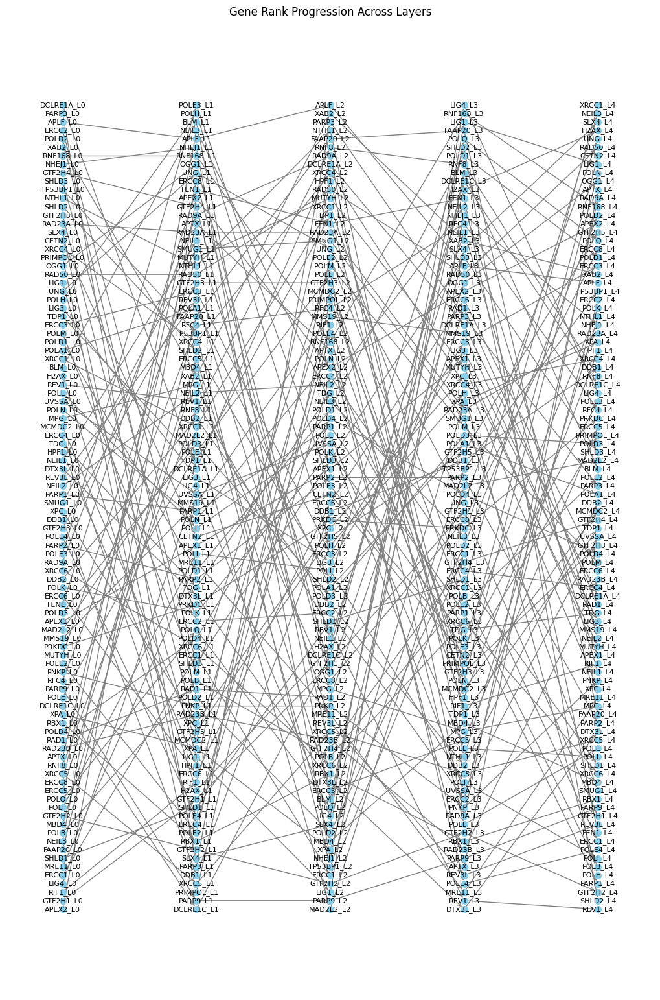

In [130]:
import matplotlib.pyplot as plt
import networkx as nx

# The rank positions for each gene across four layers
gene_ranks = rank_dict

G = nx.DiGraph()

# Number of layers
num_layers = len(next(iter(gene_ranks.values())))

# Add nodes and edges for each gene across the layers
for gene, ranks in gene_ranks.items():
    for layer in range(num_layers - 1):
        # Add nodes for the gene at each layer with unique identifiers
        current_node = f"{gene}_L{layer}"
        next_node = f"{gene}_L{layer + 1}"
        G.add_node(current_node, layer=layer, rank=ranks[layer])
        G.add_node(next_node, layer=layer + 1, rank=ranks[layer + 1])
        
        # Add a directed edge to show rank progression between layers
        G.add_edge(current_node, next_node)

# Position nodes to show each layer vertically
pos = {}
layer_spacing = 1.5  # Space between layers
rank_spacing = 0.3   # Space between ranks in a layer

for node, data in G.nodes(data=True):
    layer = data['layer']
    rank = data['rank']
    pos[node] = (layer * layer_spacing, -rank * rank_spacing)

# Draw the graph
plt.figure(figsize=(10, 15))
nx.draw(G, pos, with_labels=True, node_size=50, font_size=8, arrowstyle='->', arrowsize=10, node_color="skyblue", edge_color="gray")

plt.title("Gene Rank Progression Across Layers")
plt.xlabel("Layers")
plt.ylabel("Rank (Higher is lower on graph)")
plt.gca().invert_yaxis()  # To have higher ranks visually lower
plt.show()

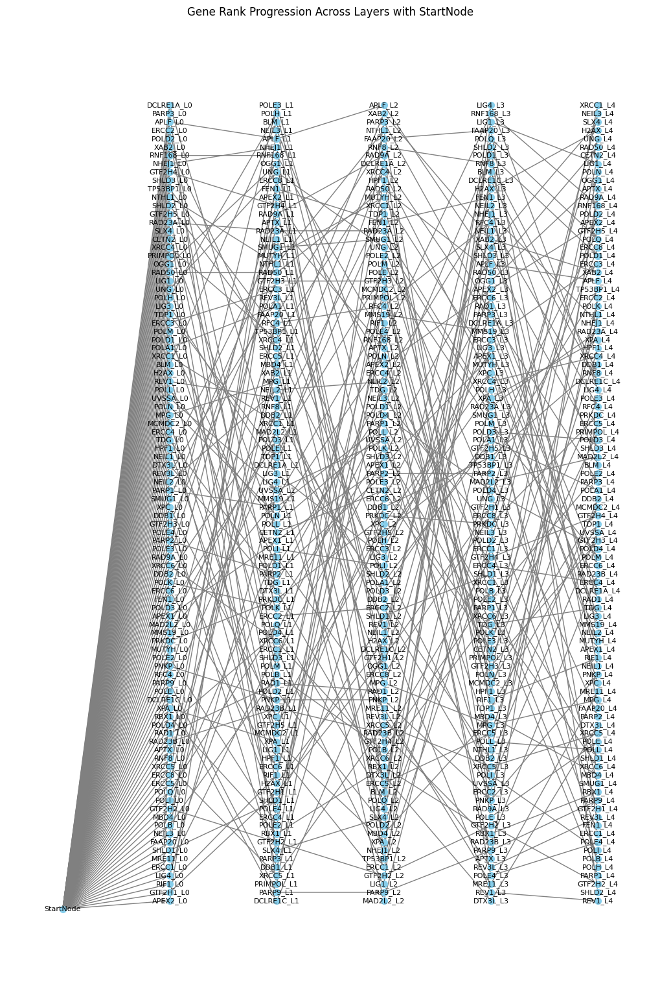

In [131]:
import matplotlib.pyplot as plt
import networkx as nx

# Example rank dictionary (you should replace this with your actual rank_dict)

# Create the directed graph
G = nx.DiGraph()

# Number of layers (based on the length of the rank list)
num_layers = len(next(iter(rank_dict.values())))

# Add the start node before the first layer
start_node = "StartNode"
G.add_node(start_node, layer=-1, rank=0)  # Layer -1 to indicate it's before the first layer

# Add nodes and edges for each gene across the layers
for gene, ranks in rank_dict.items():
    for layer in range(num_layers - 1):
        # Add nodes for the gene at each layer with unique identifiers
        current_node = f"{gene}_L{layer}"
        next_node = f"{gene}_L{layer + 1}"
        G.add_node(current_node, layer=layer, rank=ranks[layer])
        G.add_node(next_node, layer=layer + 1, rank=ranks[layer + 1])
        
        # Add a directed edge to show rank progression between layers
        G.add_edge(current_node, next_node)
    
    # Add edges from the start node to the first layer nodes
    first_layer_node = f"{gene}_L0"
    G.add_edge(start_node, first_layer_node)

# Position nodes to show each layer vertically
pos = {}
layer_spacing = 1.5  # Space between layers
rank_spacing = 0.3   # Space between ranks in a layer

for node, data in G.nodes(data=True):
    layer = data['layer']
    rank = data['rank']
    pos[node] = (layer * layer_spacing, -rank * rank_spacing)

# Draw the graph
plt.figure(figsize=(10, 15))
nx.draw(G, pos, with_labels=True, node_size=50, font_size=8, arrowstyle='->', arrowsize=10, node_color="skyblue", edge_color="gray")

# Title and labels
plt.title("Gene Rank Progression Across Layers with StartNode")
plt.xlabel("Layers")
plt.ylabel("Rank (Higher is lower on graph)")
plt.gca().invert_yaxis()  # To have higher ranks visually lower
plt.savefig("gene_rank_progression.svg", format="svg")
plt.savefig("smaller_plots/smaller_gene_ranked_prgression_control_to_prodromal.png", dpi=100)

plt.show()


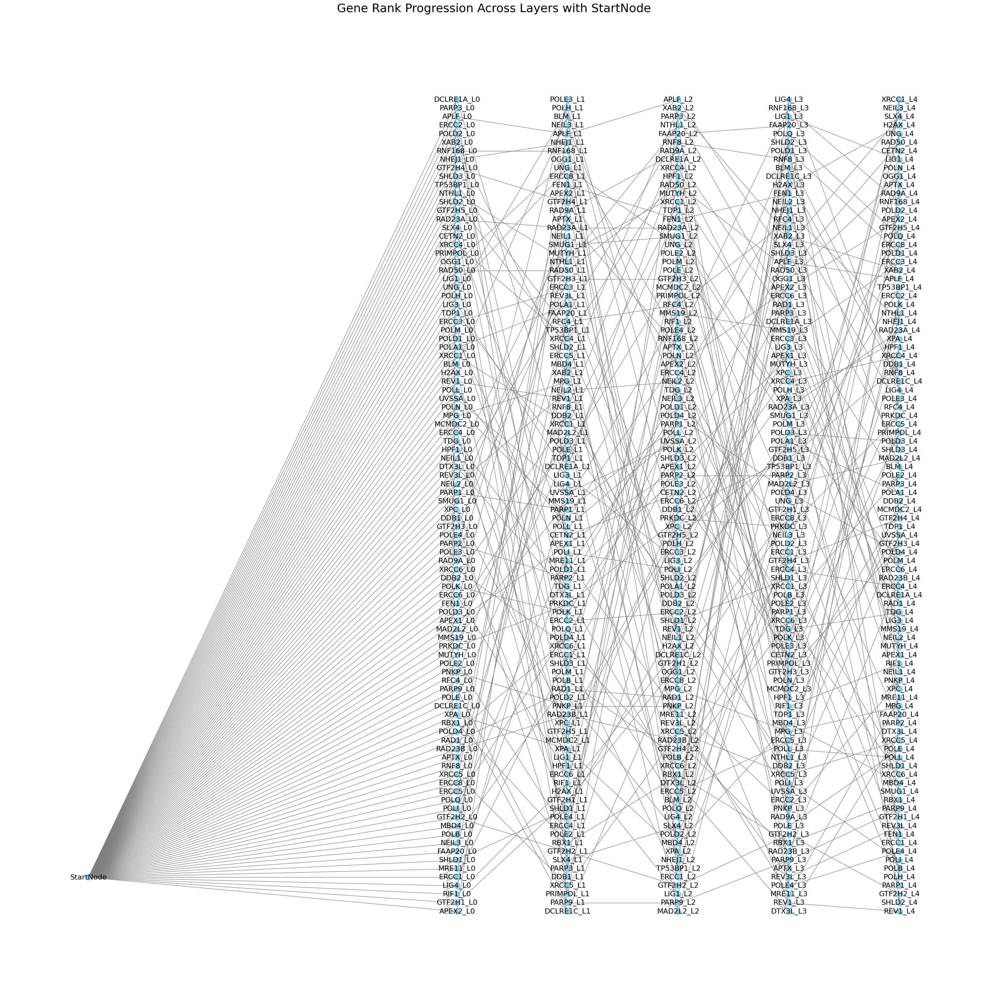

In [132]:
import matplotlib.pyplot as plt
import networkx as nx

# Example rank dictionary (you should replace this with your actual rank_dict)



# Create the directed graph
G = nx.DiGraph()

# Number of layers (based on the length of the rank list)
num_layers = len(next(iter(rank_dict.values())))

# Add the start node before the first layer
start_node = "StartNode"
G.add_node(start_node, layer=-1, rank=0)  # Layer -1 to indicate it's before the first layer

# Add nodes and edges for each gene across the layers
for gene, ranks in rank_dict.items():
    for layer in range(num_layers - 1):
        # Add nodes for the gene at each layer with unique identifiers
        current_node = f"{gene}_L{layer}"
        next_node = f"{gene}_L{layer + 1}"
        G.add_node(current_node, layer=layer, rank=ranks[layer])
        G.add_node(next_node, layer=layer + 1, rank=ranks[layer + 1])
        
        # Add a directed edge to show rank progression between layers
        G.add_edge(current_node, next_node)
    
    # Add edges from the start node to the first layer nodes
    first_layer_node = f"{gene}_L0"
    G.add_edge(start_node, first_layer_node)

# Position nodes to show each layer vertically
pos = {}
layer_spacing = 1.5  # Space between layers
rank_spacing = 0.3   # Space between ranks in a layer

# Set the position of the StartNode to be at the mid-left of the first layer
start_node_x_pos = -5 # Fixed position on the left
start_node_y_pos = -1.5  # Middle of first layer vertically

# Position the nodes
for node, data in G.nodes(data=True):
    layer = data['layer']
    rank = data['rank']
    
    if layer == -1:
        # Place the StartNode on the mid-left of the first layer
        pos[node] = (start_node_x_pos, start_node_y_pos)
    else:
        # Place other nodes based on their layer and rank
        pos[node] = (layer * layer_spacing, -rank * rank_spacing)

# Draw the graph
plt.figure(figsize=(30, 30))
nx.draw(G, pos, with_labels=True, node_size=150, font_size=16, arrowstyle='->', arrowsize=40, node_color="skyblue", edge_color="gray")

# Title and labels
plt.title("Gene Rank Progression Across Layers with StartNode", fontsize=26)
plt.xlabel("Layers")
plt.ylabel("Rank (Higher is lower on graph)")
plt.gca().invert_yaxis()  # To have higher ranks visually lower

# Save the plot as an SVG file
plt.savefig("gene_rank_progression_with_start_node_left.svg", format="svg")
plt.savefig("gene_rank_progression_with_start_node_left.png", format="png")
# Show the plot
plt.show()


In [133]:
!mkdir -p feature_importance_weights/smaller_set_genes/control_vs_pd

def return_value(i):

    l = [AVG_FEATURE_IMPORTANCES_PD_BL_Control_BL[i],AVG_FEATURE_IMPORTANCES_PD_V02_Control_V02[i],AVG_FEATURE_IMPORTANCES_PD_V04_Control_V04[i],
    AVG_FEATURE_IMPORTANCES_PD_V06_Control_V06[i],AVG_FEATURE_IMPORTANCES_PD_V08_Control_V08[i]]
    return l


li = []
genes = []
for i in AVG_FEATURE_IMPORTANCES_PD_BL_Control_BL.keys():
    
    li.append(return_value(i))
    genes.append(i)

df = pd.DataFrame(li)
df['genes'] = genes
df = df.set_index('genes')
df.columns = ['BL','V02','V04','V06','V08']
df['Gene_Name'] =df.reset_index()['genes'].apply(return_gene_name).tolist()
df = df.set_index('Gene_Name')
df.to_csv(f'feature_importance_weights/smaller_set_genes/control_vs_pd/control_vs_pd.csv',index = True)
df


The history saving thread hit an unexpected error (OperationalError('attempt to write a readonly database')).History will not be written to the database.


,BL,V02,V04,V06,V08
Gene_Name,,,,,
POLH,-0.319455,-0.575449,-0.109074,0.161118,0.008049
LIG1,-0.337050,-0.047614,-0.001375,-0.674795,-0.572716
DCLRE1A,-1.079308,-0.150104,0.544207,0.247158,-0.111932
SHLD2,0.429220,0.215485,-0.095448,0.579683,-0.005693
POLD2,0.648060,0.068114,0.010926,0.097177,0.463478
...,...,...,...,...,...
PRIMPOL,-0.345782,-0.005986,-0.255247,0.058785,0.232250
LIG3,0.312038,-0.140973,0.103076,-0.193741,0.107588
GTF2H3,-0.128692,-0.263995,0.259692,-0.056376,-0.148870
